# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

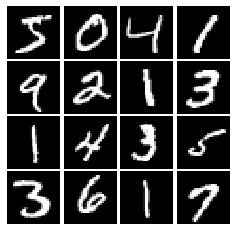

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.maximum(alpha*x, x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform([batch_size, dim], -1, 1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [8]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(input_shape = (784,), units = 256, activation = leaky_relu),
        tf.keras.layers.Dense(units = 256, activation = leaky_relu),
        tf.keras.layers.Dense(units = 1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [9]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [10]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(input_shape = (noise_dim,), units = 1024, activation = 'relu'),
        tf.keras.layers.Dense(units = 1024, activation = 'relu'),
        tf.keras.layers.Dense(units = 784, activation = 'tanh')

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [11]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [12]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    real_loss = cross_entropy(tf.ones_like(logits_real), logits_real)
    fake_loss = cross_entropy(tf.zeros_like(logits_fake), logits_fake)
    loss = real_loss + fake_loss
    
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss = cross_entropy(tf.ones_like(logits_fake), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [13]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

W0705 13:44:42.295897 10156 deprecation.py:323] From A:\Programs\Anaconda3\lib\site-packages\tensorflow\python\ops\nn_impl.py:182: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Maximum error in d_loss: 3.97058e-09


In [14]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [15]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.keras.optimizers.Adam(learning_rate = learning_rate, beta_1 = beta1)
    G_solver = tf.keras.optimizers.Adam(learning_rate = learning_rate, beta_1 = beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [16]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.953, G:0.7603


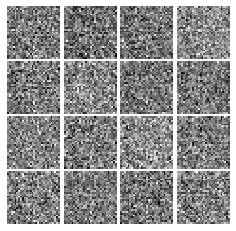

Epoch: 0, Iter: 20, D: 0.5772, G:1.036


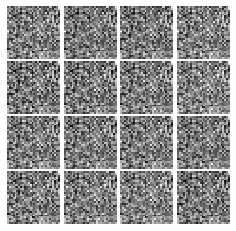

Epoch: 0, Iter: 40, D: 0.5064, G:0.9939


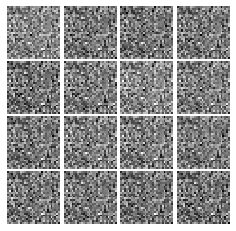

Epoch: 0, Iter: 60, D: 0.1931, G:2.412


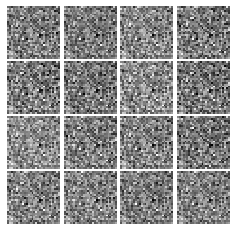

Epoch: 0, Iter: 80, D: 0.9931, G:1.968


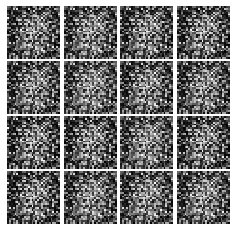

Epoch: 0, Iter: 100, D: 0.4331, G:1.461


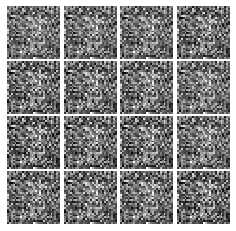

Epoch: 0, Iter: 120, D: 1.164, G:1.028


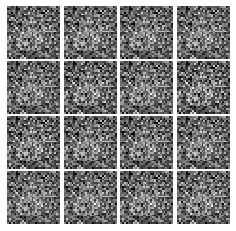

Epoch: 0, Iter: 140, D: 1.557, G:0.4948


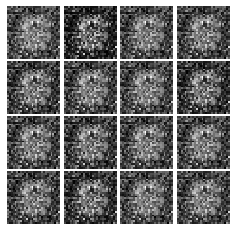

Epoch: 0, Iter: 160, D: 1.265, G:1.022


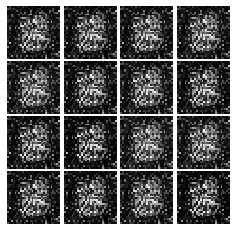

Epoch: 0, Iter: 180, D: 1.73, G:0.424


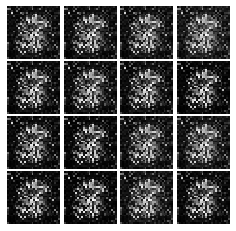

Epoch: 0, Iter: 200, D: 1.315, G:0.5474


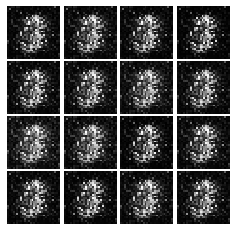

Epoch: 0, Iter: 220, D: 1.295, G:1.164


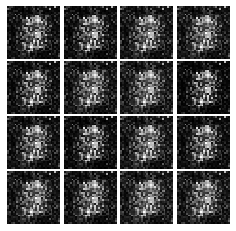

Epoch: 0, Iter: 240, D: 1.563, G:1.061


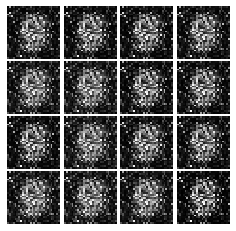

Epoch: 0, Iter: 260, D: 1.756, G:0.874


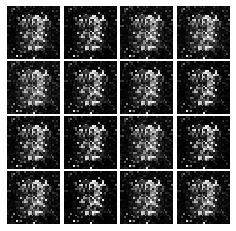

Epoch: 0, Iter: 280, D: 1.386, G:1.002


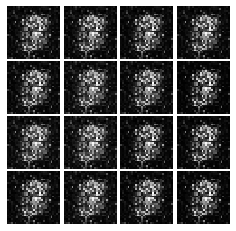

Epoch: 0, Iter: 300, D: 1.572, G:1.054


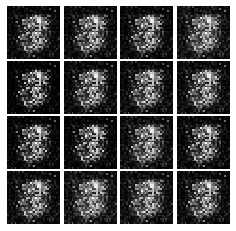

Epoch: 0, Iter: 320, D: 1.697, G:0.6963


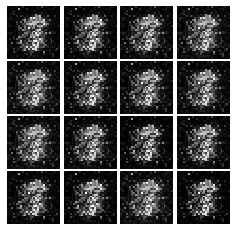

Epoch: 0, Iter: 340, D: 1.145, G:0.797


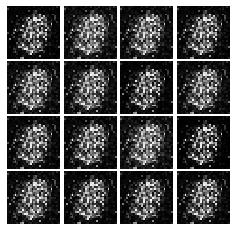

Epoch: 0, Iter: 360, D: 0.8329, G:1.451


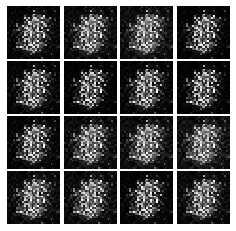

Epoch: 0, Iter: 380, D: 1.848, G:1.244


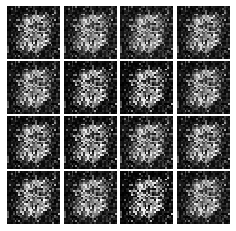

Epoch: 0, Iter: 400, D: 1.614, G:0.9181


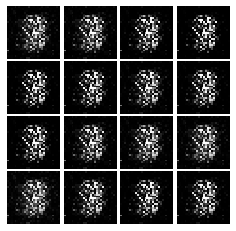

Epoch: 0, Iter: 420, D: 1.204, G:0.9881


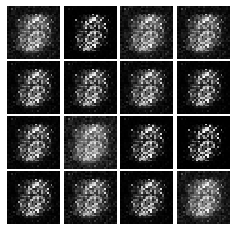

Epoch: 0, Iter: 440, D: 1.049, G:1.159


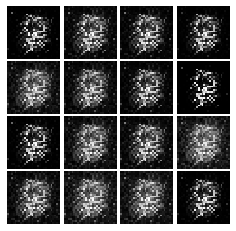

Epoch: 0, Iter: 460, D: 1.485, G:0.5641


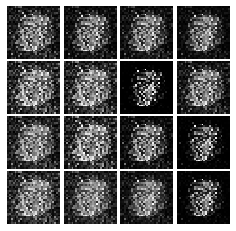

Epoch: 1, Iter: 480, D: 1.335, G:0.8774


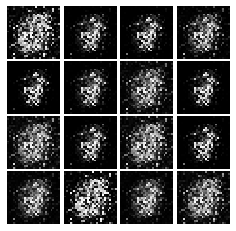

Epoch: 1, Iter: 500, D: 1.648, G:0.7991


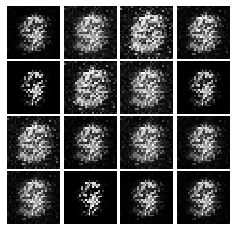

Epoch: 1, Iter: 520, D: 1.43, G:0.9186


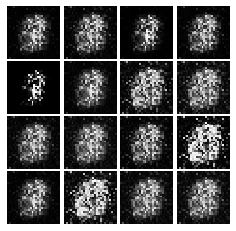

Epoch: 1, Iter: 540, D: 1.506, G:0.8825


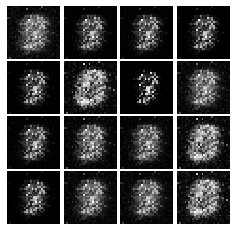

Epoch: 1, Iter: 560, D: 1.421, G:0.7768


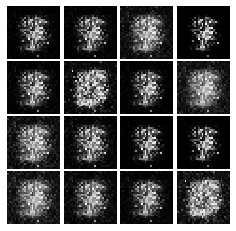

Epoch: 1, Iter: 580, D: 1.714, G:0.2072


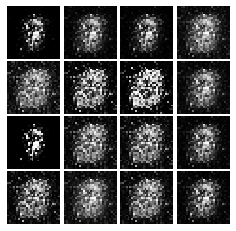

Epoch: 1, Iter: 600, D: 1.236, G:0.9598


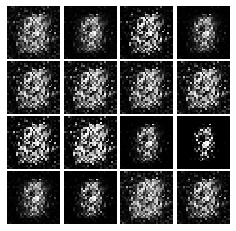

Epoch: 1, Iter: 620, D: 1.033, G:1.266


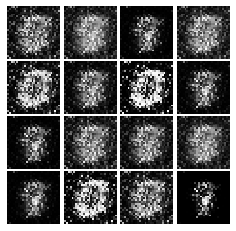

Epoch: 1, Iter: 640, D: 0.8135, G:1.574


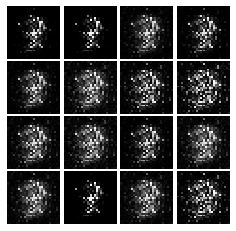

Epoch: 1, Iter: 660, D: 1.151, G:1.415


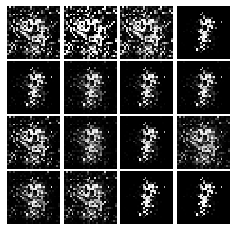

Epoch: 1, Iter: 680, D: 0.913, G:1.196


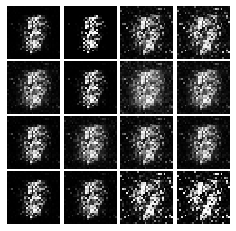

Epoch: 1, Iter: 700, D: 1.3, G:1.119


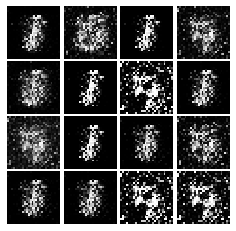

Epoch: 1, Iter: 720, D: 1.294, G:0.8855


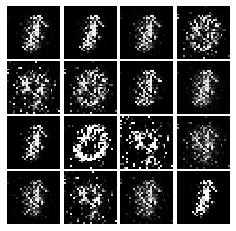

Epoch: 1, Iter: 740, D: 1.344, G:3.701


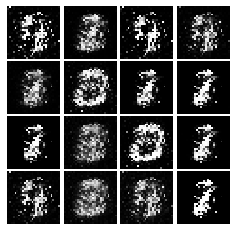

Epoch: 1, Iter: 760, D: 1.392, G:1.032


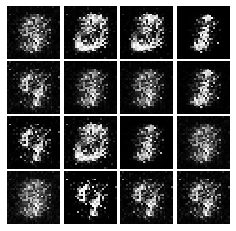

Epoch: 1, Iter: 780, D: 1.206, G:1.008


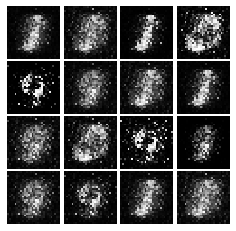

Epoch: 1, Iter: 800, D: 1.202, G:1.132


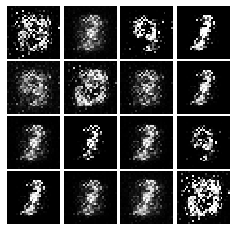

Epoch: 1, Iter: 820, D: 2.041, G:0.4518


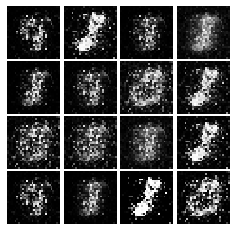

Epoch: 1, Iter: 840, D: 0.9199, G:1.153


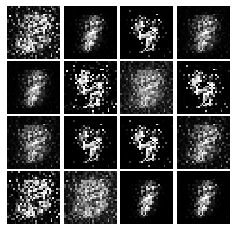

Epoch: 1, Iter: 860, D: 1.09, G:1.311


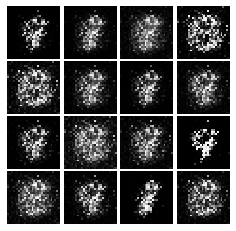

Epoch: 1, Iter: 880, D: 1.331, G:0.8263


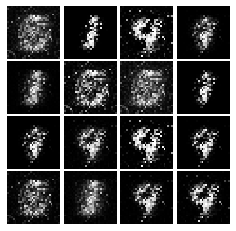

Epoch: 1, Iter: 900, D: 1.253, G:0.8424


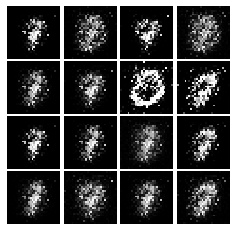

Epoch: 1, Iter: 920, D: 1.301, G:1.206


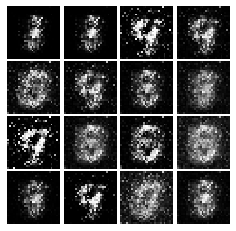

Epoch: 2, Iter: 940, D: 1.391, G:0.9661


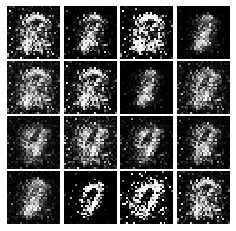

Epoch: 2, Iter: 960, D: 1.211, G:1.292


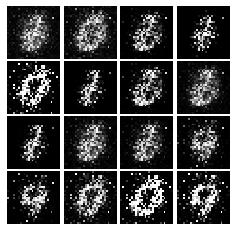

Epoch: 2, Iter: 980, D: 1.273, G:1.503


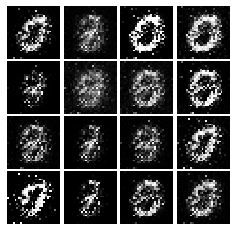

Epoch: 2, Iter: 1000, D: 1.169, G:1.278


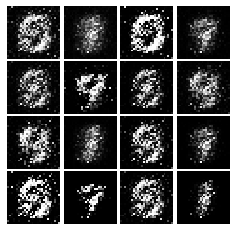

Epoch: 2, Iter: 1020, D: 1.44, G:2.337


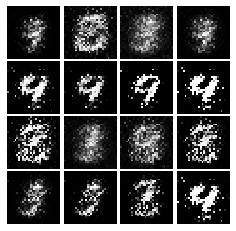

Epoch: 2, Iter: 1040, D: 1.237, G:0.564


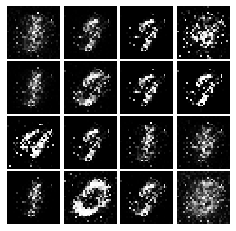

Epoch: 2, Iter: 1060, D: 1.181, G:1.125


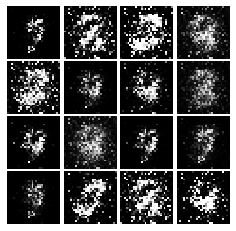

Epoch: 2, Iter: 1080, D: 1.08, G:1.307


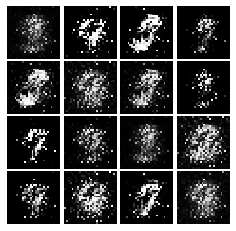

Epoch: 2, Iter: 1100, D: 1.025, G:1.28


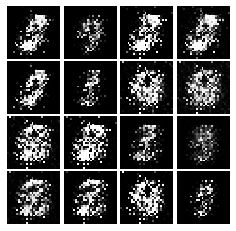

Epoch: 2, Iter: 1120, D: 1.16, G:1.217


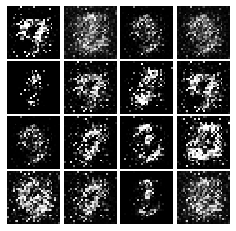

Epoch: 2, Iter: 1140, D: 1.135, G:1.586


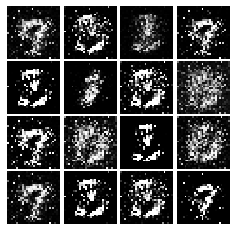

Epoch: 2, Iter: 1160, D: 1.244, G:1.407


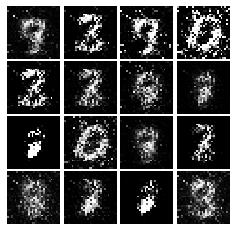

Epoch: 2, Iter: 1180, D: 1.057, G:1.24


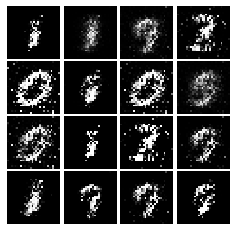

Epoch: 2, Iter: 1200, D: 1.006, G:1.535


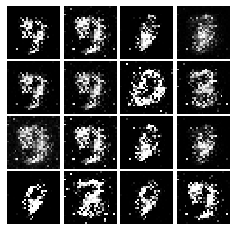

Epoch: 2, Iter: 1220, D: 0.8036, G:2.174


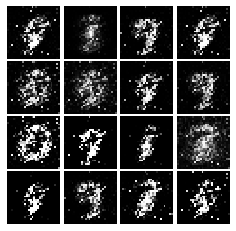

Epoch: 2, Iter: 1240, D: 1.236, G:0.79


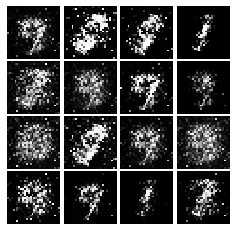

Epoch: 2, Iter: 1260, D: 1.353, G:1.009


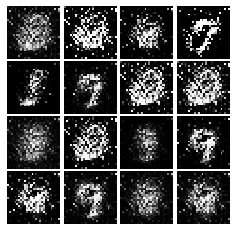

Epoch: 2, Iter: 1280, D: 1.245, G:1.387


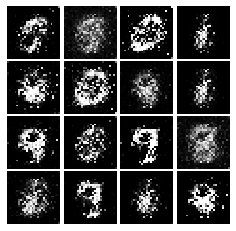

Epoch: 2, Iter: 1300, D: 1.271, G:0.9928


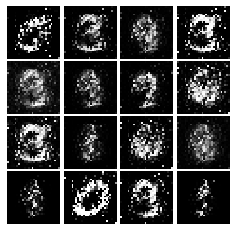

Epoch: 2, Iter: 1320, D: 1.932, G:0.9555


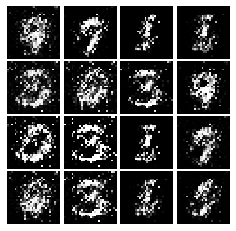

Epoch: 2, Iter: 1340, D: 1.302, G:0.9251


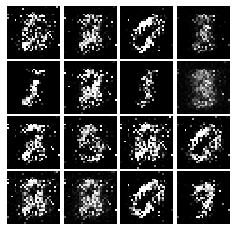

Epoch: 2, Iter: 1360, D: 1.491, G:0.5472


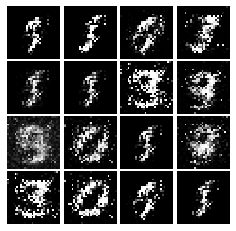

Epoch: 2, Iter: 1380, D: 1.173, G:1.063


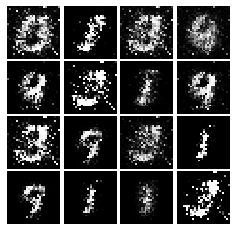

Epoch: 2, Iter: 1400, D: 0.9388, G:1.564


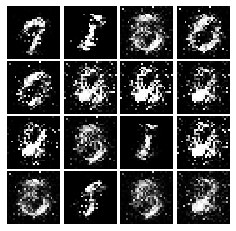

Epoch: 3, Iter: 1420, D: 1.14, G:1.068


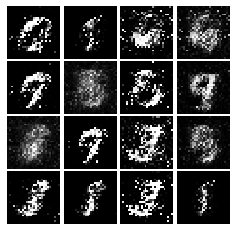

Epoch: 3, Iter: 1440, D: 1.134, G:1.033


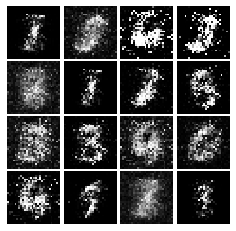

Epoch: 3, Iter: 1460, D: 1.174, G:1.252


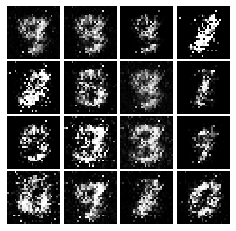

Epoch: 3, Iter: 1480, D: 1.372, G:0.8807


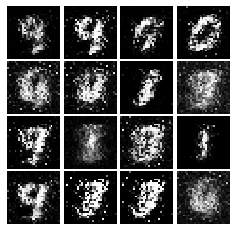

Epoch: 3, Iter: 1500, D: 1.295, G:0.9593


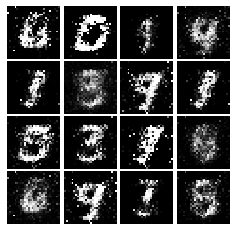

Epoch: 3, Iter: 1520, D: 1.407, G:1.013


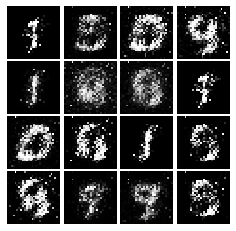

Epoch: 3, Iter: 1540, D: 1.391, G:0.9904


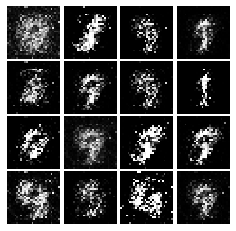

Epoch: 3, Iter: 1560, D: 1.259, G:1.04


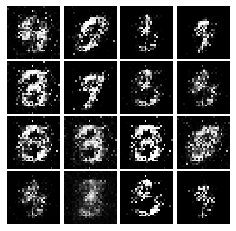

Epoch: 3, Iter: 1580, D: 1.21, G:0.9903


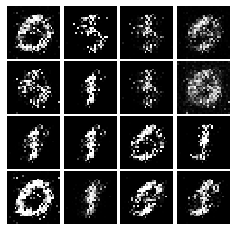

Epoch: 3, Iter: 1600, D: 1.217, G:1.203


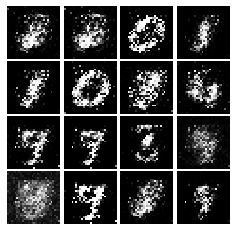

Epoch: 3, Iter: 1620, D: 1.379, G:0.9482


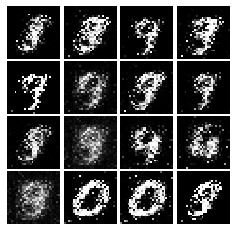

Epoch: 3, Iter: 1640, D: 1.32, G:0.9953


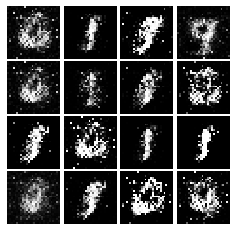

Epoch: 3, Iter: 1660, D: 1.023, G:0.9673


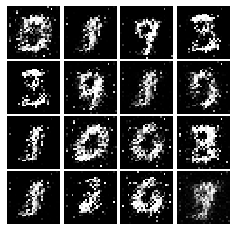

Epoch: 3, Iter: 1680, D: 1.13, G:0.9625


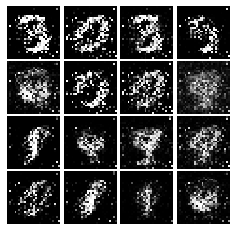

Epoch: 3, Iter: 1700, D: 1.548, G:1.393


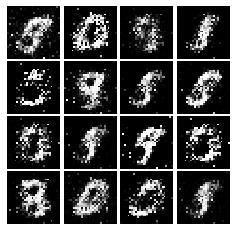

Epoch: 3, Iter: 1720, D: 1.194, G:0.9405


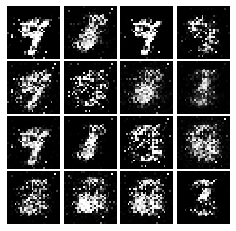

Epoch: 3, Iter: 1740, D: 1.254, G:0.9327


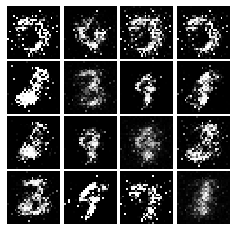

Epoch: 3, Iter: 1760, D: 1.139, G:1.0


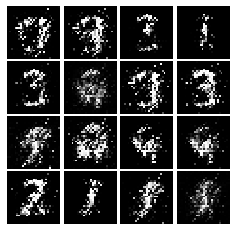

Epoch: 3, Iter: 1780, D: 1.099, G:0.7653


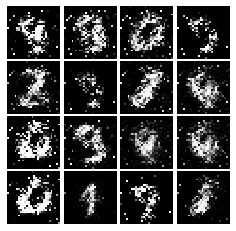

Epoch: 3, Iter: 1800, D: 1.369, G:0.7531


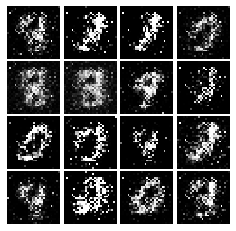

Epoch: 3, Iter: 1820, D: 1.348, G:0.8735


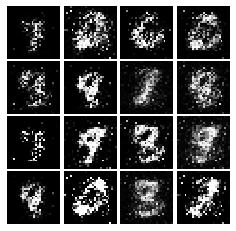

Epoch: 3, Iter: 1840, D: 1.422, G:0.9171


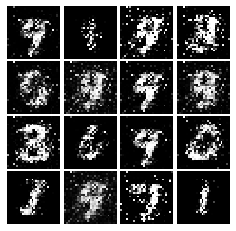

Epoch: 3, Iter: 1860, D: 1.187, G:0.5304


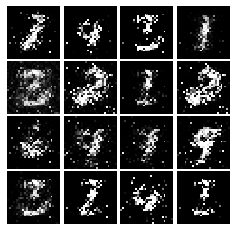

Epoch: 4, Iter: 1880, D: 1.287, G:0.5769


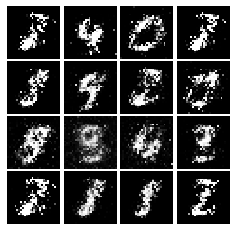

Epoch: 4, Iter: 1900, D: 1.239, G:0.8131


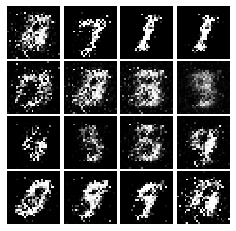

Epoch: 4, Iter: 1920, D: 1.037, G:1.106


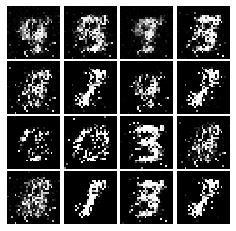

Epoch: 4, Iter: 1940, D: 1.041, G:1.314


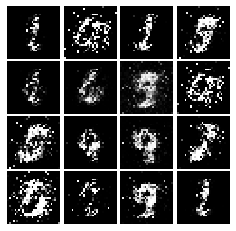

Epoch: 4, Iter: 1960, D: 1.199, G:1.126


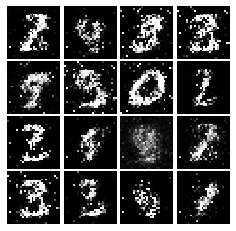

Epoch: 4, Iter: 1980, D: 1.267, G:0.9897


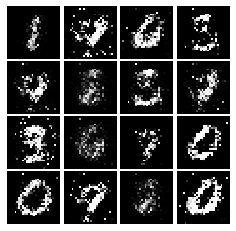

Epoch: 4, Iter: 2000, D: 1.307, G:0.8973


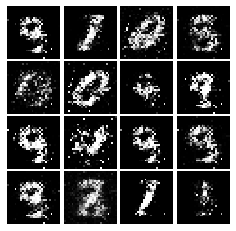

Epoch: 4, Iter: 2020, D: 1.269, G:0.8378


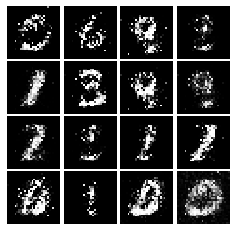

Epoch: 4, Iter: 2040, D: 1.293, G:0.8685


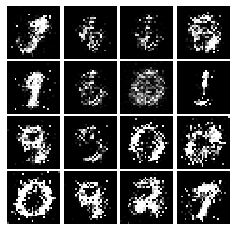

Epoch: 4, Iter: 2060, D: 1.252, G:1.038


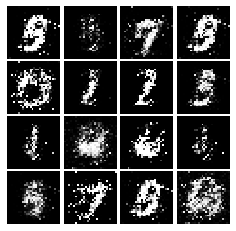

Epoch: 4, Iter: 2080, D: 1.314, G:0.7677


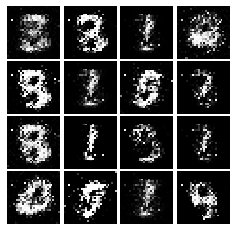

Epoch: 4, Iter: 2100, D: 1.283, G:1.061


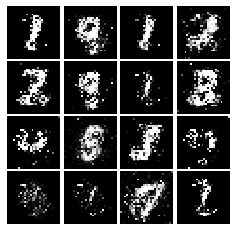

Epoch: 4, Iter: 2120, D: 1.298, G:0.9235


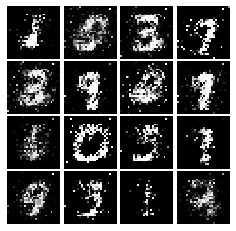

Epoch: 4, Iter: 2140, D: 1.294, G:1.033


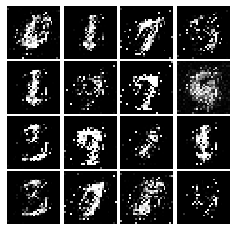

Epoch: 4, Iter: 2160, D: 1.43, G:0.8952


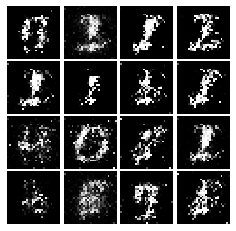

Epoch: 4, Iter: 2180, D: 1.058, G:1.149


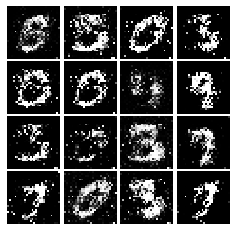

Epoch: 4, Iter: 2200, D: 1.461, G:1.417


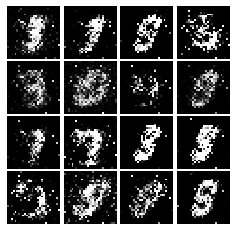

Epoch: 4, Iter: 2220, D: 1.309, G:1.076


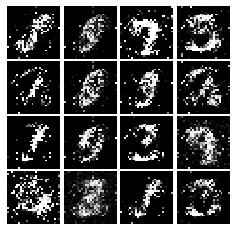

Epoch: 4, Iter: 2240, D: 1.438, G:0.8902


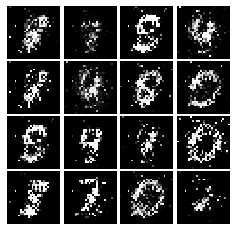

Epoch: 4, Iter: 2260, D: 1.193, G:1.268


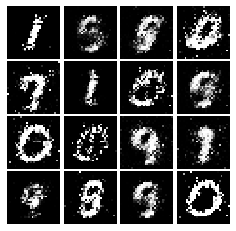

Epoch: 4, Iter: 2280, D: 1.039, G:0.9549


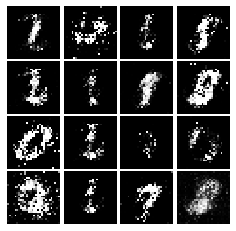

Epoch: 4, Iter: 2300, D: 1.18, G:0.9697


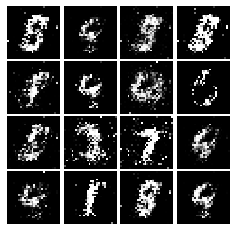

Epoch: 4, Iter: 2320, D: 1.259, G:1.057


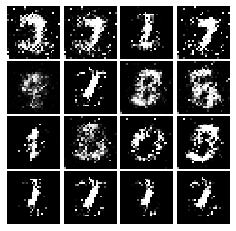

Epoch: 4, Iter: 2340, D: 1.124, G:1.092


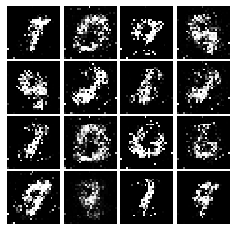

Epoch: 5, Iter: 2360, D: 1.301, G:1.186


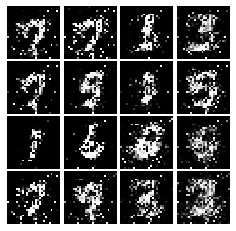

Epoch: 5, Iter: 2380, D: 1.108, G:1.203


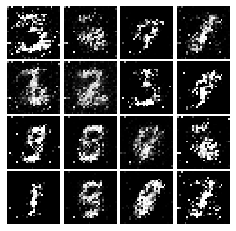

Epoch: 5, Iter: 2400, D: 1.28, G:1.482


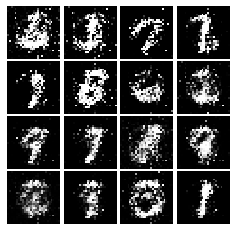

Epoch: 5, Iter: 2420, D: 1.276, G:1.167


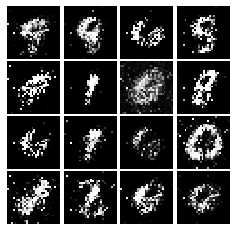

Epoch: 5, Iter: 2440, D: 1.327, G:1.178


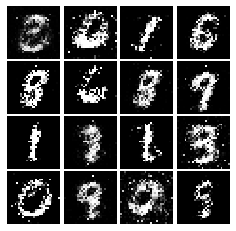

Epoch: 5, Iter: 2460, D: 1.264, G:0.8903


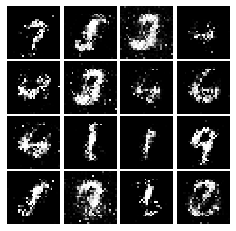

Epoch: 5, Iter: 2480, D: 1.243, G:0.8684


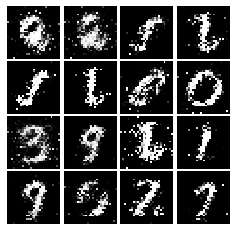

Epoch: 5, Iter: 2500, D: 1.264, G:0.9779


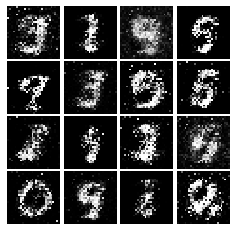

Epoch: 5, Iter: 2520, D: 1.378, G:1.08


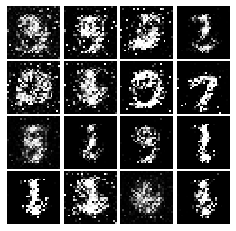

Epoch: 5, Iter: 2540, D: 1.258, G:1.011


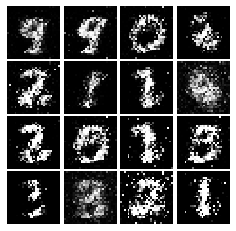

Epoch: 5, Iter: 2560, D: 1.266, G:0.9357


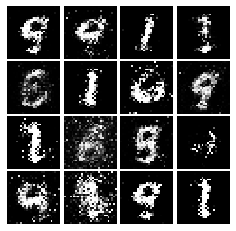

Epoch: 5, Iter: 2580, D: 1.291, G:0.8353


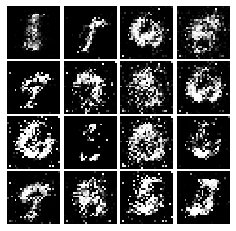

Epoch: 5, Iter: 2600, D: 1.503, G:0.7847


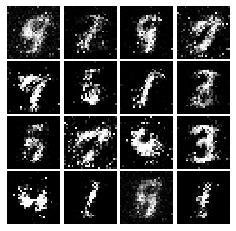

Epoch: 5, Iter: 2620, D: 1.349, G:0.7894


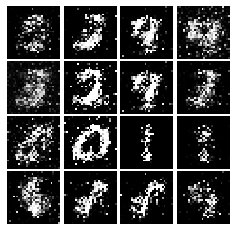

Epoch: 5, Iter: 2640, D: 1.242, G:0.8081


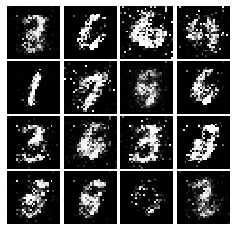

Epoch: 5, Iter: 2660, D: 1.3, G:0.8221


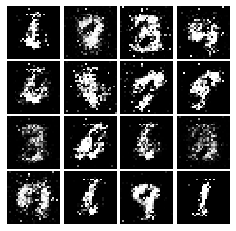

Epoch: 5, Iter: 2680, D: 1.484, G:0.9825


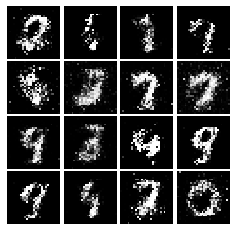

Epoch: 5, Iter: 2700, D: 1.385, G:0.887


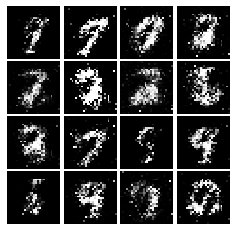

Epoch: 5, Iter: 2720, D: 1.27, G:1.33


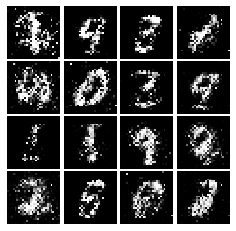

Epoch: 5, Iter: 2740, D: 1.285, G:0.8918


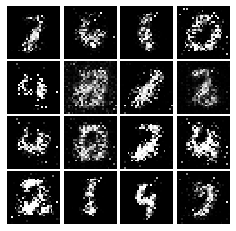

Epoch: 5, Iter: 2760, D: 1.218, G:0.5169


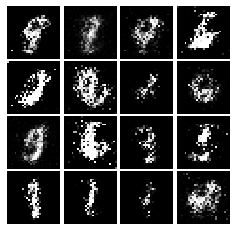

Epoch: 5, Iter: 2780, D: 1.235, G:0.9945


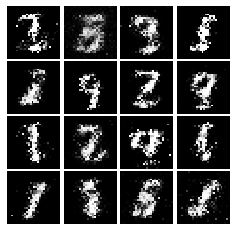

Epoch: 5, Iter: 2800, D: 1.32, G:0.766


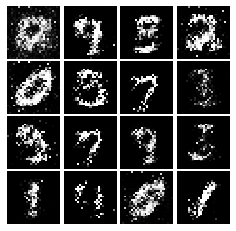

Epoch: 6, Iter: 2820, D: 1.241, G:0.9453


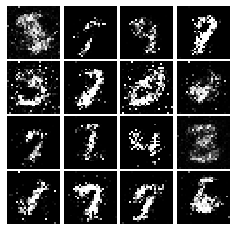

Epoch: 6, Iter: 2840, D: 1.232, G:0.9435


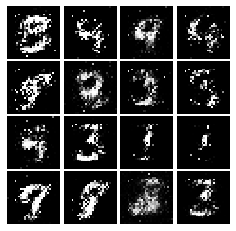

Epoch: 6, Iter: 2860, D: 1.291, G:0.9633


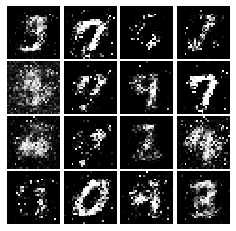

Epoch: 6, Iter: 2880, D: 1.255, G:1.057


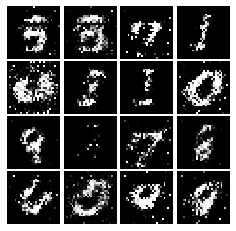

Epoch: 6, Iter: 2900, D: 1.24, G:1.009


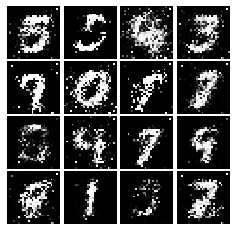

Epoch: 6, Iter: 2920, D: 1.347, G:0.7586


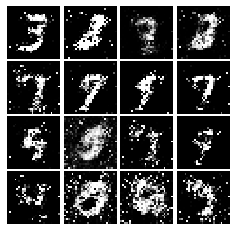

Epoch: 6, Iter: 2940, D: 1.329, G:0.7914


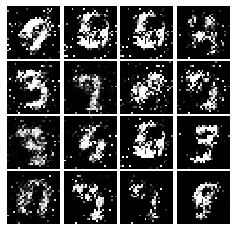

Epoch: 6, Iter: 2960, D: 1.304, G:0.8636


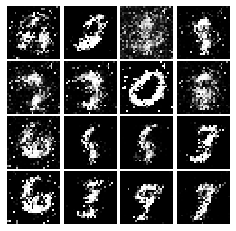

Epoch: 6, Iter: 2980, D: 1.371, G:0.8959


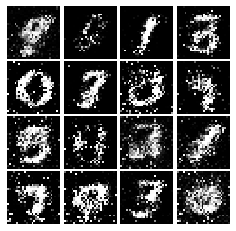

Epoch: 6, Iter: 3000, D: 1.396, G:0.9988


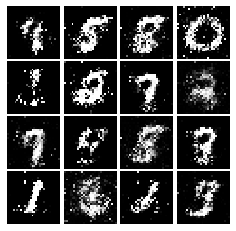

Epoch: 6, Iter: 3020, D: 1.298, G:0.9432


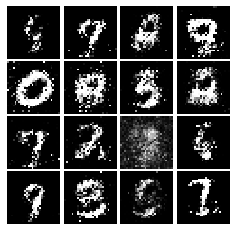

Epoch: 6, Iter: 3040, D: 1.294, G:1.107


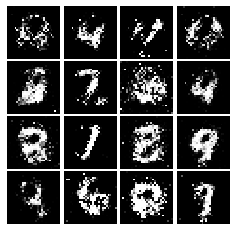

Epoch: 6, Iter: 3060, D: 1.267, G:0.8126


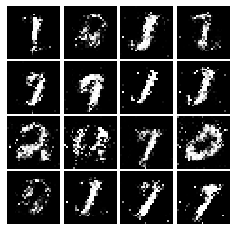

Epoch: 6, Iter: 3080, D: 1.365, G:0.8874


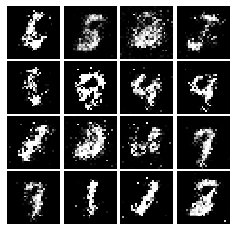

Epoch: 6, Iter: 3100, D: 1.282, G:0.8923


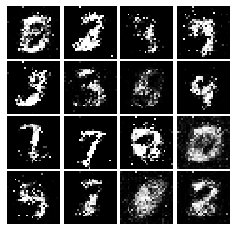

Epoch: 6, Iter: 3120, D: 1.259, G:0.855


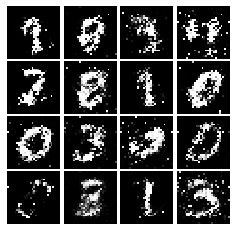

Epoch: 6, Iter: 3140, D: 1.411, G:0.8063


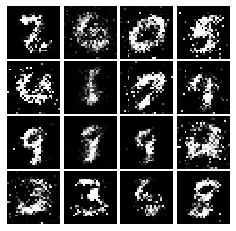

Epoch: 6, Iter: 3160, D: 1.372, G:0.9014


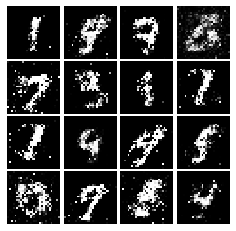

Epoch: 6, Iter: 3180, D: 1.21, G:0.927


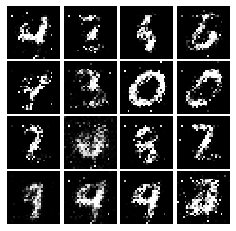

Epoch: 6, Iter: 3200, D: 1.244, G:0.8242


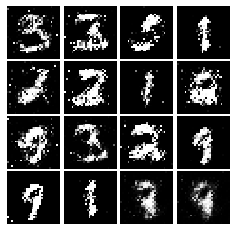

Epoch: 6, Iter: 3220, D: 1.273, G:0.8141


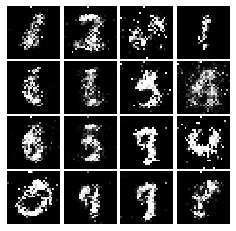

Epoch: 6, Iter: 3240, D: 1.32, G:0.7858


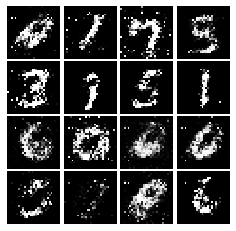

Epoch: 6, Iter: 3260, D: 1.324, G:0.8236


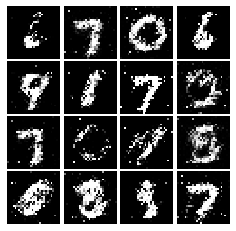

Epoch: 6, Iter: 3280, D: 1.331, G:0.7912


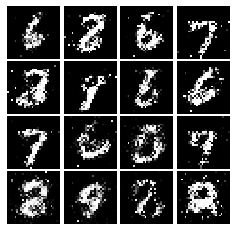

Epoch: 7, Iter: 3300, D: 1.351, G:0.8495


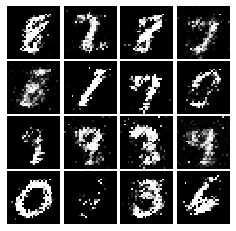

Epoch: 7, Iter: 3320, D: 1.172, G:1.113


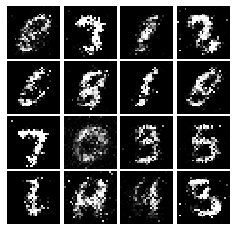

Epoch: 7, Iter: 3340, D: 1.361, G:0.8144


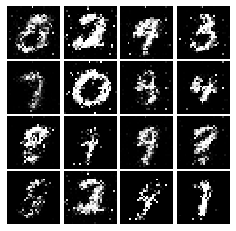

Epoch: 7, Iter: 3360, D: 1.353, G:0.7905


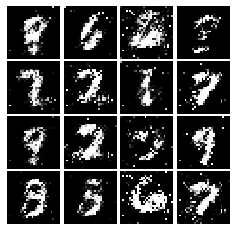

Epoch: 7, Iter: 3380, D: 1.341, G:0.7934


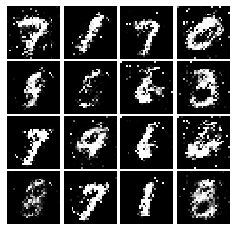

Epoch: 7, Iter: 3400, D: 1.325, G:0.8304


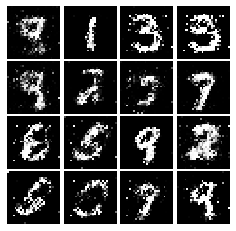

Epoch: 7, Iter: 3420, D: 1.343, G:0.8179


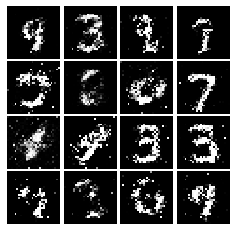

Epoch: 7, Iter: 3440, D: 1.334, G:0.8154


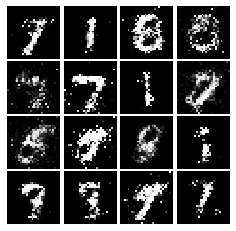

Epoch: 7, Iter: 3460, D: 1.358, G:0.8454


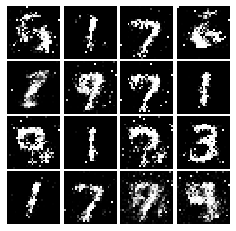

Epoch: 7, Iter: 3480, D: 1.407, G:0.7305


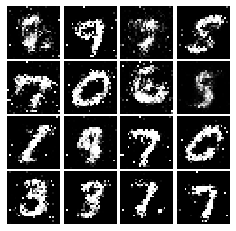

Epoch: 7, Iter: 3500, D: 1.349, G:0.7091


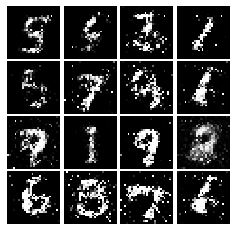

Epoch: 7, Iter: 3520, D: 1.358, G:0.8021


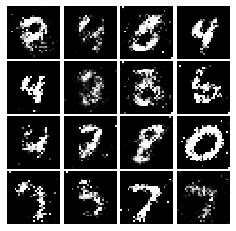

Epoch: 7, Iter: 3540, D: 1.306, G:0.8242


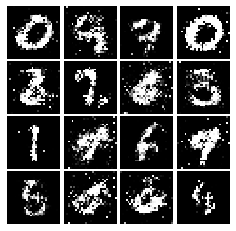

Epoch: 7, Iter: 3560, D: 1.281, G:1.695


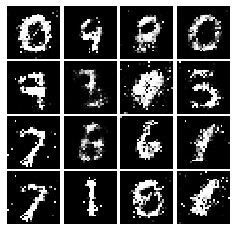

Epoch: 7, Iter: 3580, D: 1.362, G:0.771


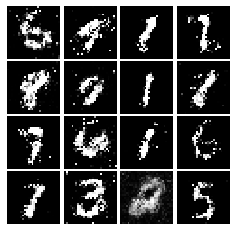

Epoch: 7, Iter: 3600, D: 1.413, G:0.7746


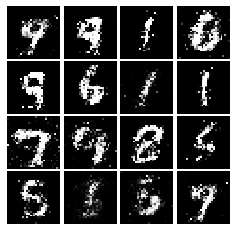

Epoch: 7, Iter: 3620, D: 1.37, G:0.7492


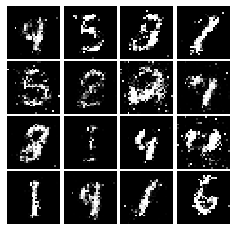

Epoch: 7, Iter: 3640, D: 1.373, G:0.7856


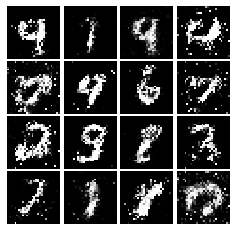

Epoch: 7, Iter: 3660, D: 1.259, G:0.7799


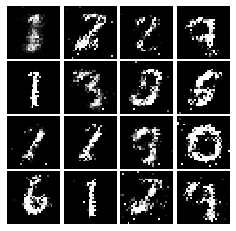

Epoch: 7, Iter: 3680, D: 1.413, G:0.5081


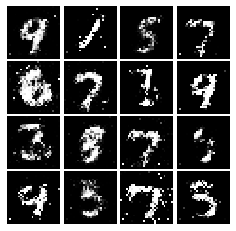

Epoch: 7, Iter: 3700, D: 1.358, G:0.8308


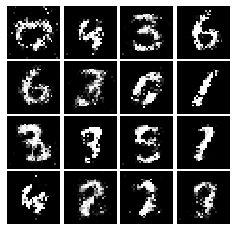

Epoch: 7, Iter: 3720, D: 1.377, G:0.8055


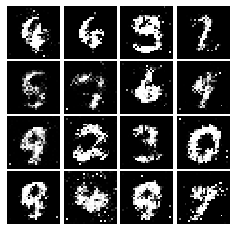

Epoch: 7, Iter: 3740, D: 1.412, G:0.7705


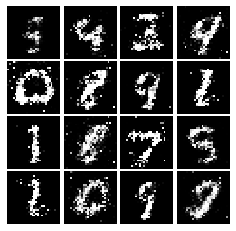

Epoch: 8, Iter: 3760, D: 1.335, G:0.8157


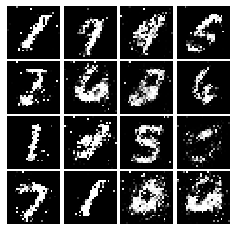

Epoch: 8, Iter: 3780, D: 1.319, G:0.7805


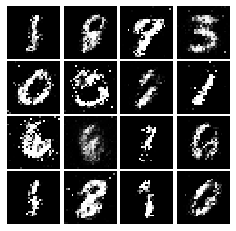

Epoch: 8, Iter: 3800, D: 1.367, G:0.8123


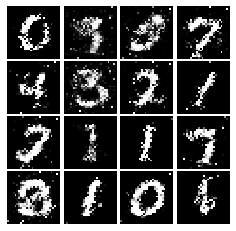

Epoch: 8, Iter: 3820, D: 1.38, G:0.6771


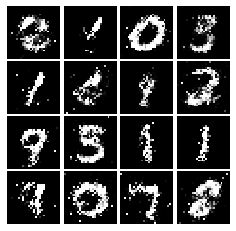

Epoch: 8, Iter: 3840, D: 1.386, G:0.8282


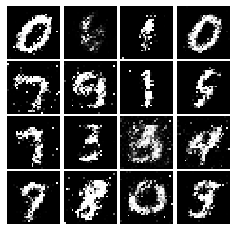

Epoch: 8, Iter: 3860, D: 1.289, G:0.8344


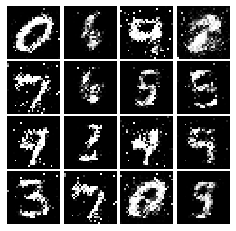

Epoch: 8, Iter: 3880, D: 1.303, G:0.7007


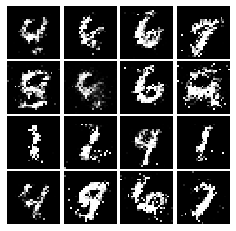

Epoch: 8, Iter: 3900, D: 1.477, G:0.7748


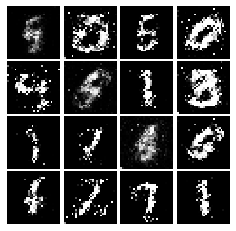

Epoch: 8, Iter: 3920, D: 1.406, G:0.777


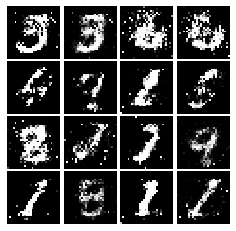

Epoch: 8, Iter: 3940, D: 1.418, G:0.7928


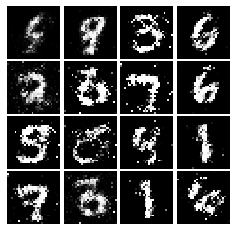

Epoch: 8, Iter: 3960, D: 1.377, G:0.8638


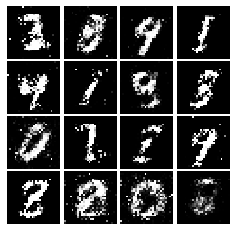

Epoch: 8, Iter: 3980, D: 1.281, G:0.8628


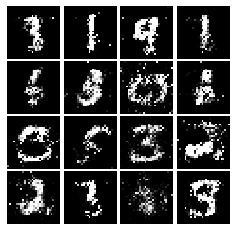

Epoch: 8, Iter: 4000, D: 1.342, G:0.779


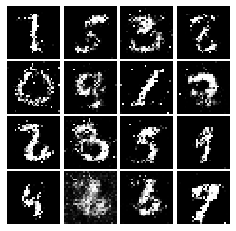

Epoch: 8, Iter: 4020, D: 1.352, G:0.7559


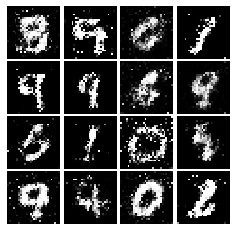

Epoch: 8, Iter: 4040, D: 1.374, G:0.762


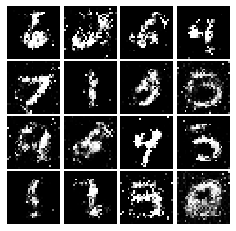

Epoch: 8, Iter: 4060, D: 1.303, G:0.8407


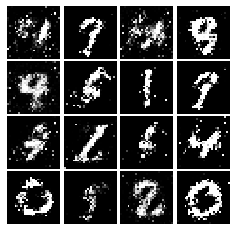

Epoch: 8, Iter: 4080, D: 1.457, G:0.6609


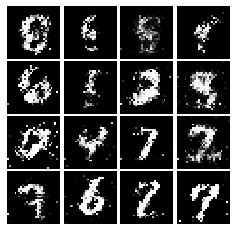

Epoch: 8, Iter: 4100, D: 1.309, G:0.7268


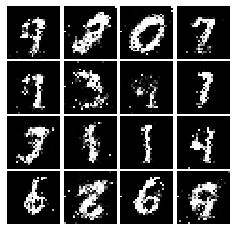

Epoch: 8, Iter: 4120, D: 1.323, G:0.7498


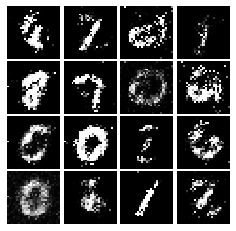

Epoch: 8, Iter: 4140, D: 1.309, G:0.7472


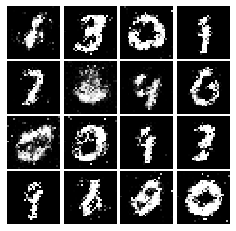

Epoch: 8, Iter: 4160, D: 1.361, G:0.7526


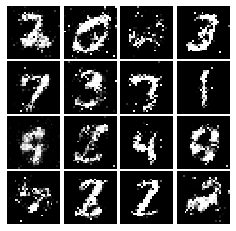

Epoch: 8, Iter: 4180, D: 1.321, G:0.7865


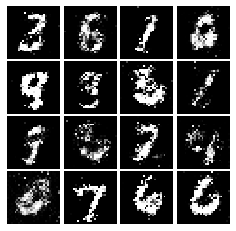

Epoch: 8, Iter: 4200, D: 1.291, G:0.8667


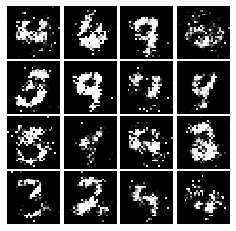

Epoch: 8, Iter: 4220, D: 1.23, G:0.9539


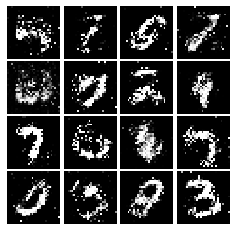

Epoch: 9, Iter: 4240, D: 1.285, G:0.8373


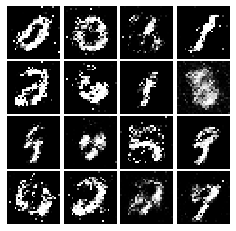

Epoch: 9, Iter: 4260, D: 1.388, G:0.7869


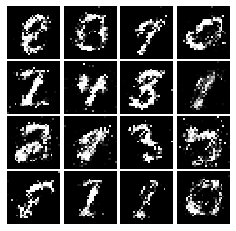

Epoch: 9, Iter: 4280, D: 1.252, G:0.8032


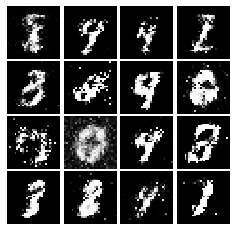

Epoch: 9, Iter: 4300, D: 1.368, G:0.8758


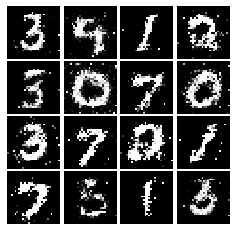

Epoch: 9, Iter: 4320, D: 1.343, G:0.7773


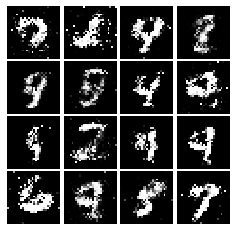

Epoch: 9, Iter: 4340, D: 1.374, G:0.7949


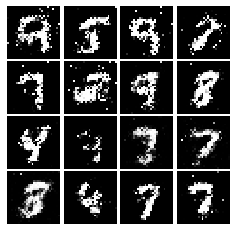

Epoch: 9, Iter: 4360, D: 1.38, G:0.7752


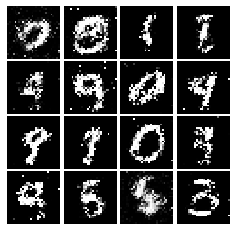

Epoch: 9, Iter: 4380, D: 1.305, G:0.9284


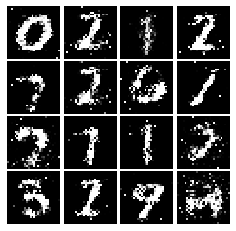

Epoch: 9, Iter: 4400, D: 1.267, G:0.8028


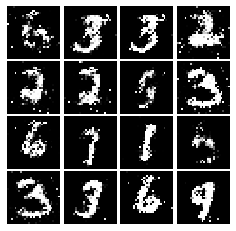

Epoch: 9, Iter: 4420, D: 1.331, G:0.9376


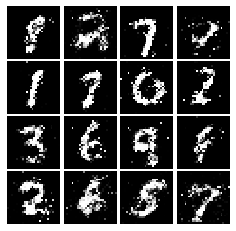

Epoch: 9, Iter: 4440, D: 1.276, G:0.7559


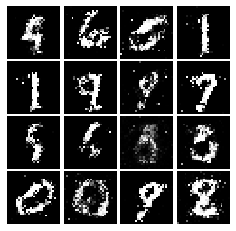

Epoch: 9, Iter: 4460, D: 1.257, G:0.8678


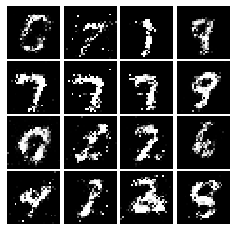

Epoch: 9, Iter: 4480, D: 1.306, G:0.7497


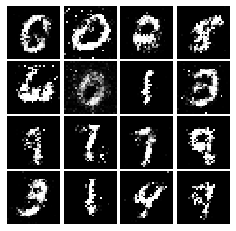

Epoch: 9, Iter: 4500, D: 1.458, G:0.9122


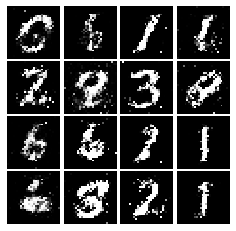

Epoch: 9, Iter: 4520, D: 1.341, G:0.8345


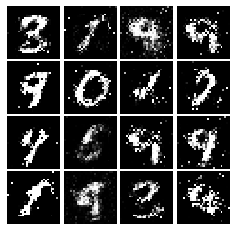

Epoch: 9, Iter: 4540, D: 1.351, G:0.8373


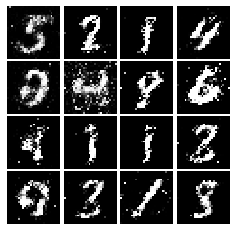

Epoch: 9, Iter: 4560, D: 1.282, G:0.7672


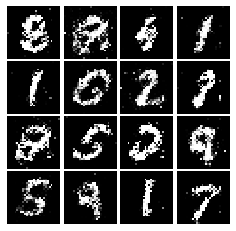

Epoch: 9, Iter: 4580, D: 1.364, G:0.8184


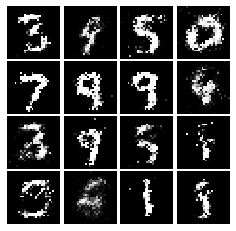

Epoch: 9, Iter: 4600, D: 1.35, G:0.7486


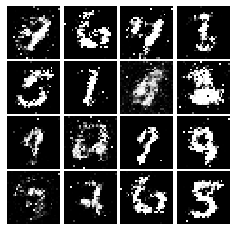

Epoch: 9, Iter: 4620, D: 1.36, G:0.7896


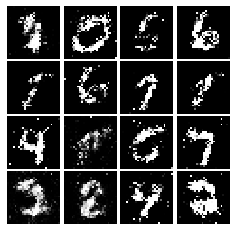

Epoch: 9, Iter: 4640, D: 1.362, G:0.7959


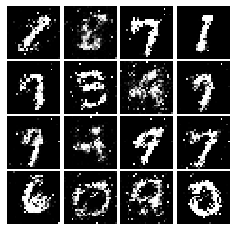

Epoch: 9, Iter: 4660, D: 1.312, G:0.8029


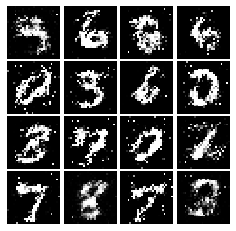

Epoch: 9, Iter: 4680, D: 1.337, G:0.6855


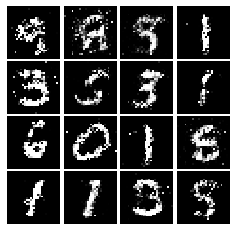

Final images


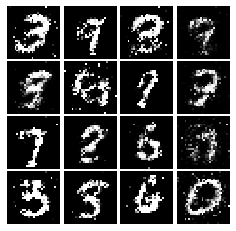

In [17]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [36]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.reduce_mean(tf.square(scores_real - 1)) + 0.5 * tf.reduce_mean(tf.square(scores_fake))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.reduce_mean(tf.square(scores_fake - 1))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [37]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.1769, G:0.3392


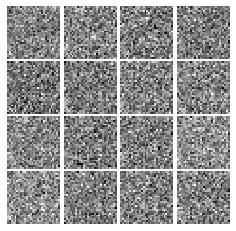

Epoch: 0, Iter: 20, D: 0.1527, G:1.612


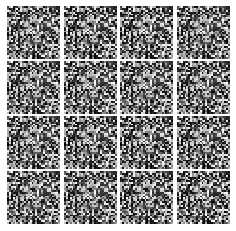

Epoch: 0, Iter: 40, D: 0.09409, G:1.013


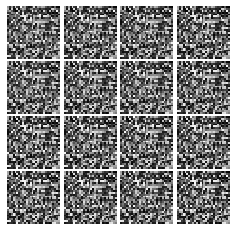

Epoch: 0, Iter: 60, D: 0.1129, G:0.6048


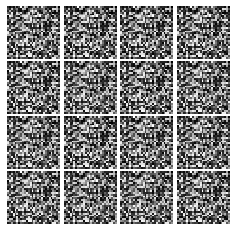

Epoch: 0, Iter: 80, D: 0.01019, G:0.5302


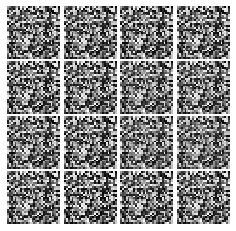

Epoch: 0, Iter: 100, D: 0.01137, G:0.5174


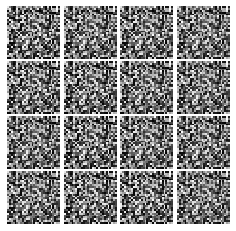

Epoch: 0, Iter: 120, D: 0.1416, G:0.4657


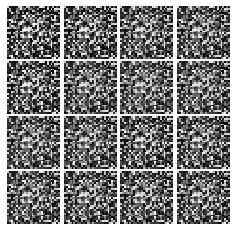

Epoch: 0, Iter: 140, D: 0.008818, G:0.5705


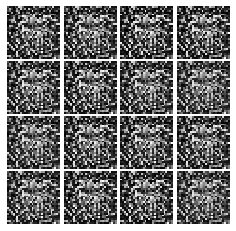

Epoch: 0, Iter: 160, D: 1.77, G:1.875


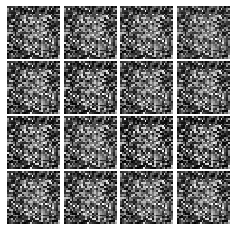

Epoch: 0, Iter: 180, D: 1.088, G:0.1802


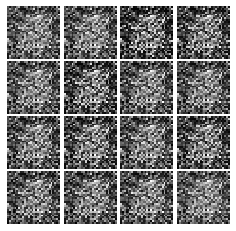

Epoch: 0, Iter: 200, D: 0.04397, G:0.765


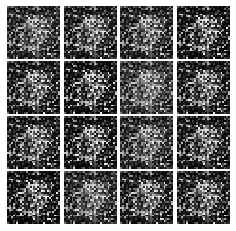

Epoch: 0, Iter: 220, D: 1.623, G:1.986


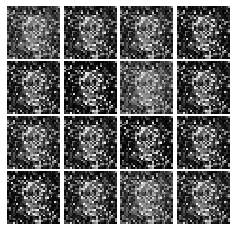

Epoch: 0, Iter: 240, D: 0.1524, G:0.2163


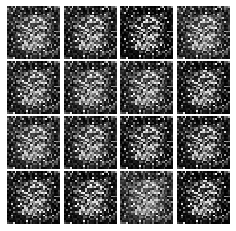

Epoch: 0, Iter: 260, D: 0.08051, G:0.4397


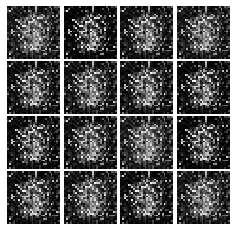

Epoch: 0, Iter: 280, D: 0.1804, G:0.7248


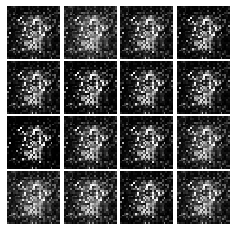

Epoch: 0, Iter: 300, D: 0.1861, G:0.3108


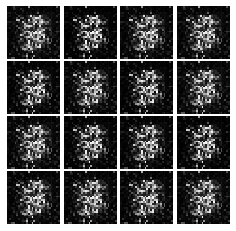

Epoch: 0, Iter: 320, D: 0.2849, G:0.374


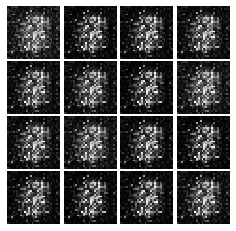

Epoch: 0, Iter: 340, D: 0.1308, G:0.5773


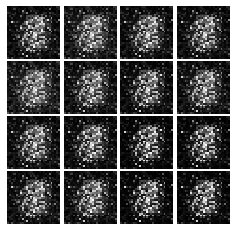

Epoch: 0, Iter: 360, D: 0.1369, G:0.478


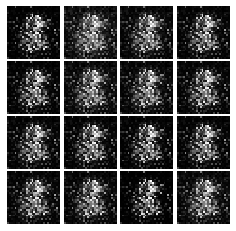

Epoch: 0, Iter: 380, D: 0.1106, G:0.328


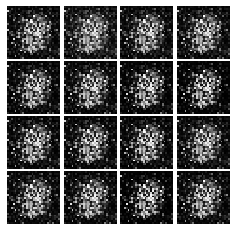

Epoch: 0, Iter: 400, D: 0.1409, G:0.3901


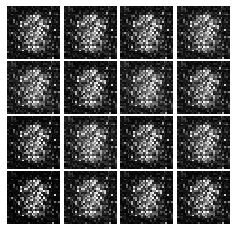

Epoch: 0, Iter: 420, D: 0.1194, G:0.4629


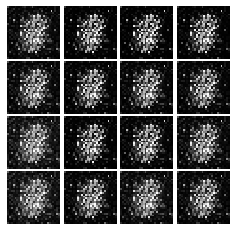

Epoch: 0, Iter: 440, D: 0.1339, G:0.5229


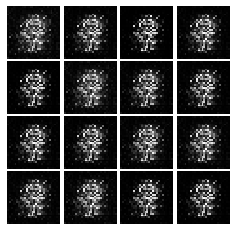

Epoch: 0, Iter: 460, D: 0.1463, G:0.6811


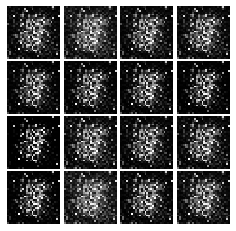

Epoch: 1, Iter: 480, D: 0.2091, G:0.8536


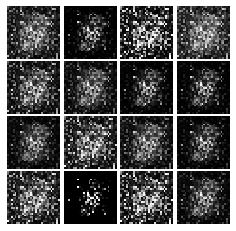

Epoch: 1, Iter: 500, D: 0.1269, G:0.4517


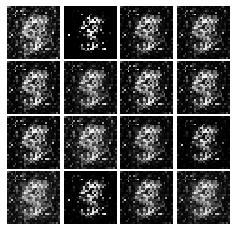

Epoch: 1, Iter: 520, D: 0.1991, G:0.5549


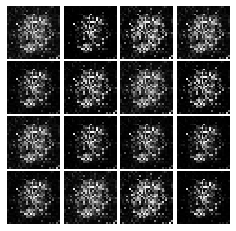

Epoch: 1, Iter: 540, D: 0.1187, G:0.4389


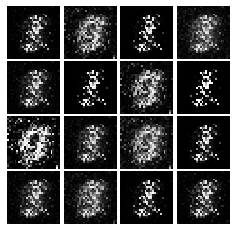

Epoch: 1, Iter: 560, D: 0.08571, G:0.3245


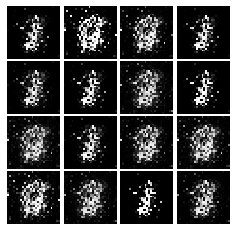

Epoch: 1, Iter: 580, D: 0.06916, G:0.5502


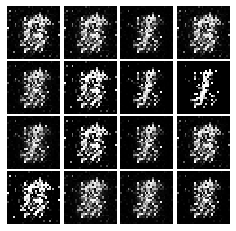

Epoch: 1, Iter: 600, D: 0.2568, G:0.06418


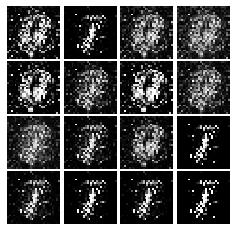

Epoch: 1, Iter: 620, D: 0.1493, G:0.3753


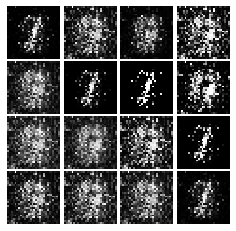

Epoch: 1, Iter: 640, D: 0.1155, G:0.3652


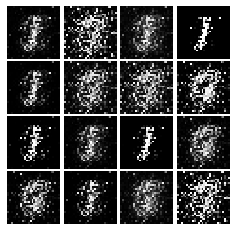

Epoch: 1, Iter: 660, D: 0.1729, G:0.3449


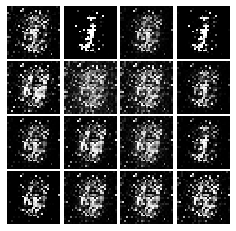

Epoch: 1, Iter: 680, D: 0.1277, G:0.4938


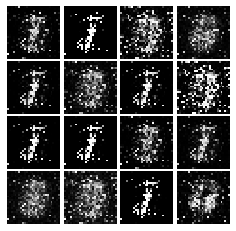

Epoch: 1, Iter: 700, D: 0.0963, G:0.3096


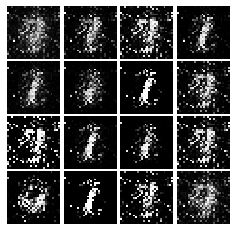

Epoch: 1, Iter: 720, D: 0.1289, G:0.32


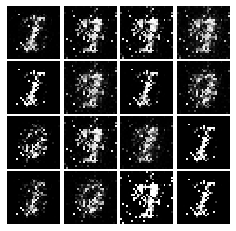

Epoch: 1, Iter: 740, D: 0.08978, G:0.5362


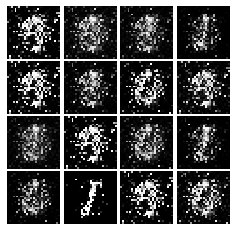

Epoch: 1, Iter: 760, D: 0.09935, G:0.5703


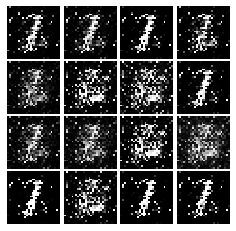

Epoch: 1, Iter: 780, D: 0.1732, G:0.3014


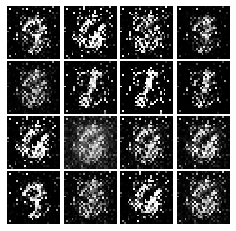

Epoch: 1, Iter: 800, D: 0.09749, G:0.3739


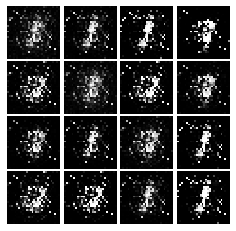

Epoch: 1, Iter: 820, D: 0.08926, G:0.3831


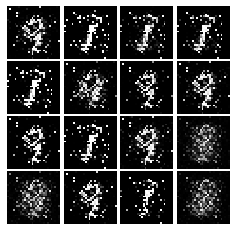

Epoch: 1, Iter: 840, D: 0.252, G:0.2564


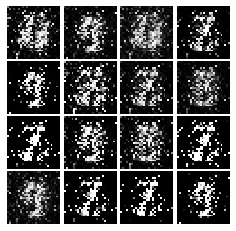

Epoch: 1, Iter: 860, D: 0.1481, G:0.5911


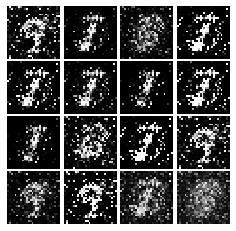

Epoch: 1, Iter: 880, D: 0.1106, G:0.3839


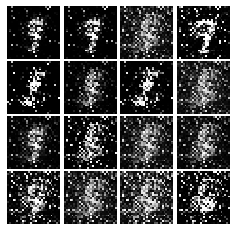

Epoch: 1, Iter: 900, D: 0.08337, G:0.5125


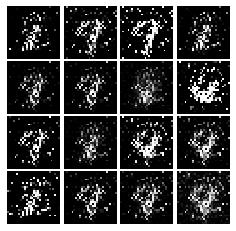

Epoch: 1, Iter: 920, D: 0.09944, G:0.5019


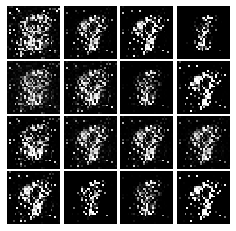

Epoch: 2, Iter: 940, D: 0.2427, G:0.1539


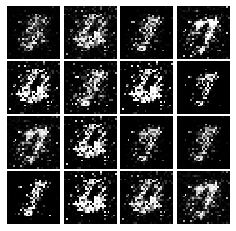

Epoch: 2, Iter: 960, D: 0.1476, G:0.4079


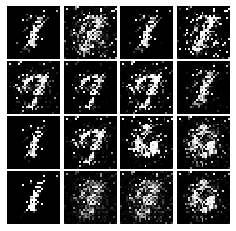

Epoch: 2, Iter: 980, D: 0.1232, G:0.3734


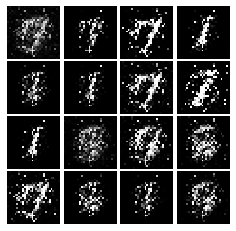

Epoch: 2, Iter: 1000, D: 0.08182, G:0.513


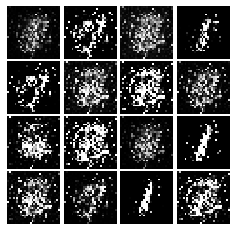

Epoch: 2, Iter: 1020, D: 0.1078, G:0.5073


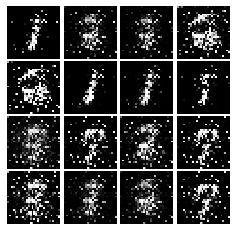

Epoch: 2, Iter: 1040, D: 0.08991, G:0.806


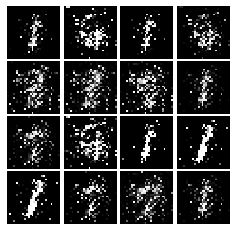

Epoch: 2, Iter: 1060, D: 0.1153, G:0.4796


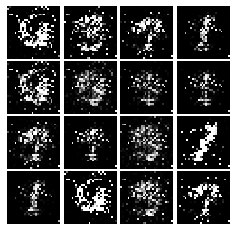

Epoch: 2, Iter: 1080, D: 0.113, G:0.3629


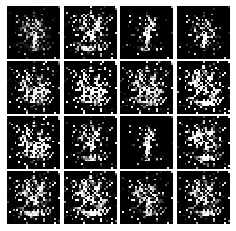

Epoch: 2, Iter: 1100, D: 0.4381, G:0.232


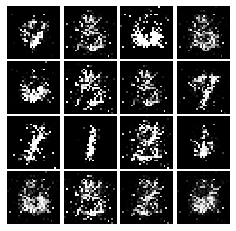

Epoch: 2, Iter: 1120, D: 0.111, G:0.349


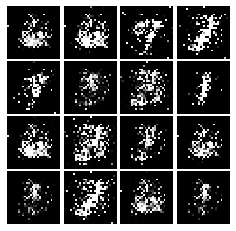

Epoch: 2, Iter: 1140, D: 0.1254, G:0.3576


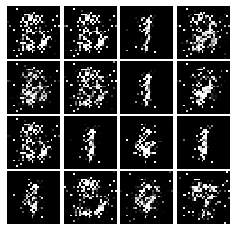

Epoch: 2, Iter: 1160, D: 0.1533, G:0.3318


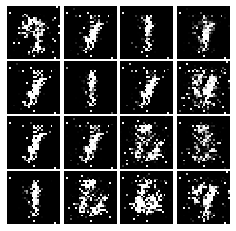

Epoch: 2, Iter: 1180, D: 0.2031, G:1.168


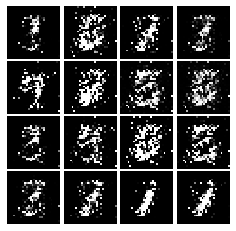

Epoch: 2, Iter: 1200, D: 0.1173, G:0.2397


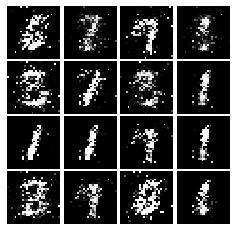

Epoch: 2, Iter: 1220, D: 0.1015, G:0.4066


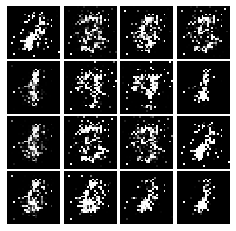

Epoch: 2, Iter: 1240, D: 0.09934, G:0.3515


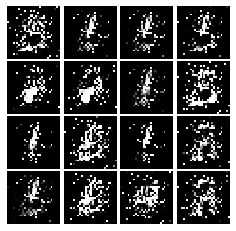

Epoch: 2, Iter: 1260, D: 0.2213, G:0.1652


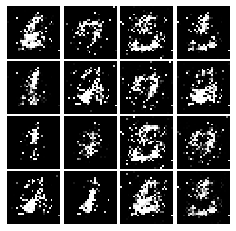

Epoch: 2, Iter: 1280, D: 0.1582, G:0.3353


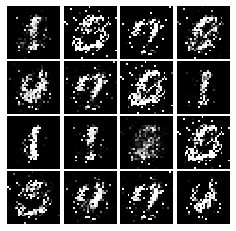

Epoch: 2, Iter: 1300, D: 0.1451, G:0.3433


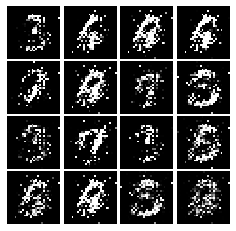

Epoch: 2, Iter: 1320, D: 0.141, G:0.2577


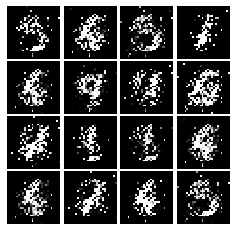

Epoch: 2, Iter: 1340, D: 0.1398, G:0.3755


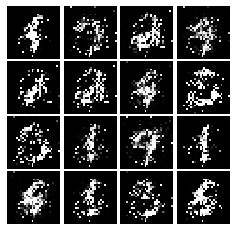

Epoch: 2, Iter: 1360, D: 0.1065, G:0.3777


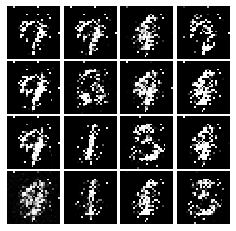

Epoch: 2, Iter: 1380, D: 0.1018, G:0.4519


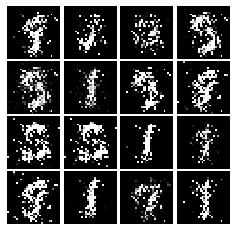

Epoch: 2, Iter: 1400, D: 0.08136, G:0.6989


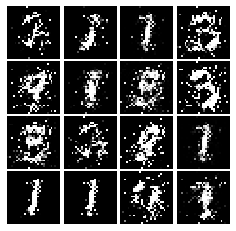

Epoch: 3, Iter: 1420, D: 0.1567, G:0.3669


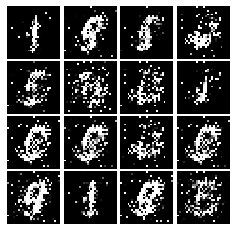

Epoch: 3, Iter: 1440, D: 0.1175, G:0.4364


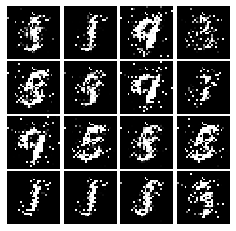

Epoch: 3, Iter: 1460, D: 0.126, G:0.5091


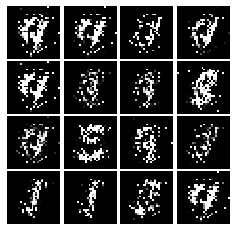

Epoch: 3, Iter: 1480, D: 0.4248, G:0.3878


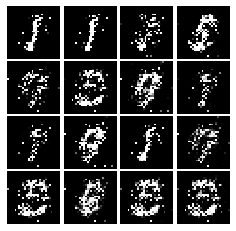

Epoch: 3, Iter: 1500, D: 0.1059, G:0.03646


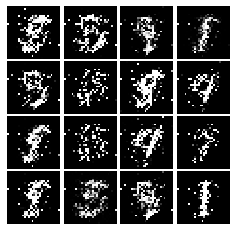

Epoch: 3, Iter: 1520, D: 0.1404, G:0.2377


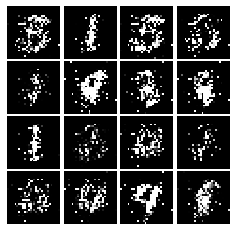

Epoch: 3, Iter: 1540, D: 0.1466, G:0.3575


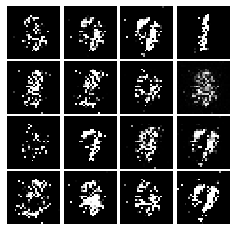

Epoch: 3, Iter: 1560, D: 0.07763, G:0.4989


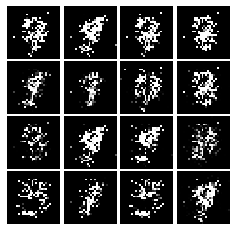

Epoch: 3, Iter: 1580, D: 0.09487, G:0.3852


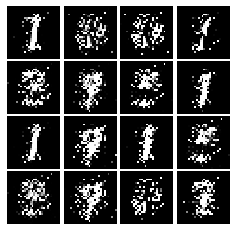

Epoch: 3, Iter: 1600, D: 0.115, G:0.3715


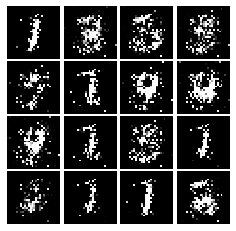

Epoch: 3, Iter: 1620, D: 0.08564, G:0.3754


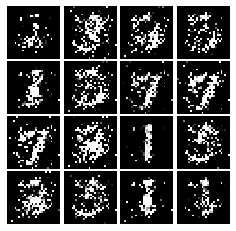

Epoch: 3, Iter: 1640, D: 0.1055, G:0.3789


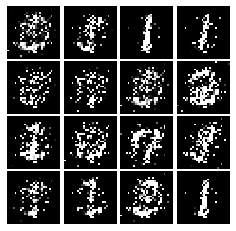

Epoch: 3, Iter: 1660, D: 0.1125, G:0.3293


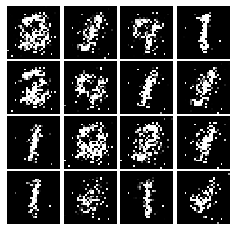

Epoch: 3, Iter: 1680, D: 0.1512, G:0.2901


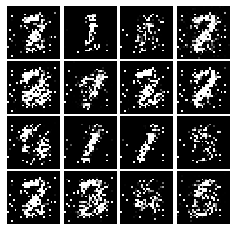

Epoch: 3, Iter: 1700, D: 0.1161, G:0.8381


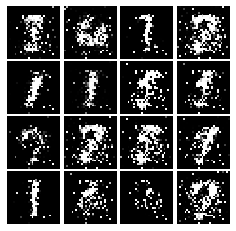

Epoch: 3, Iter: 1720, D: 0.1387, G:0.3263


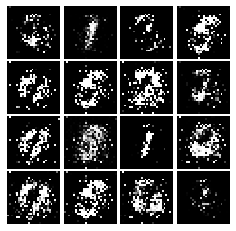

Epoch: 3, Iter: 1740, D: 0.1704, G:0.239


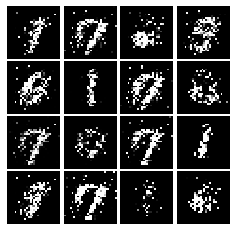

Epoch: 3, Iter: 1760, D: 0.1506, G:0.2478


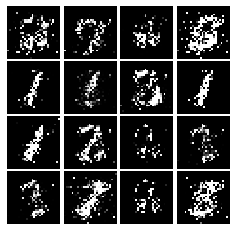

Epoch: 3, Iter: 1780, D: 0.1811, G:0.1951


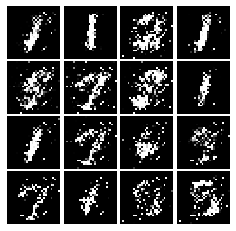

Epoch: 3, Iter: 1800, D: 0.1889, G:0.2233


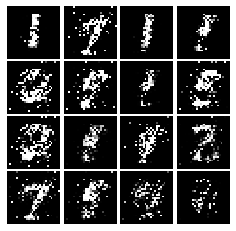

Epoch: 3, Iter: 1820, D: 0.1746, G:0.2184


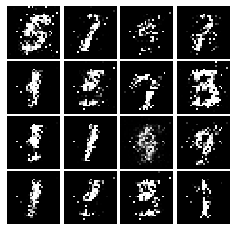

Epoch: 3, Iter: 1840, D: 0.166, G:0.3138


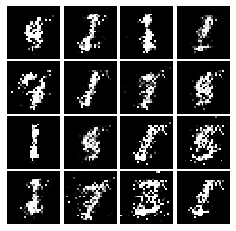

Epoch: 3, Iter: 1860, D: 0.1328, G:0.2942


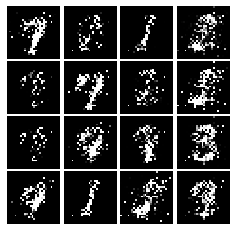

Epoch: 4, Iter: 1880, D: 0.1164, G:0.3603


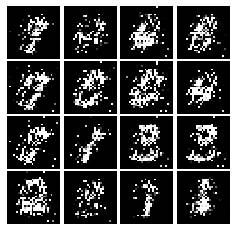

Epoch: 4, Iter: 1900, D: 0.2299, G:0.03788


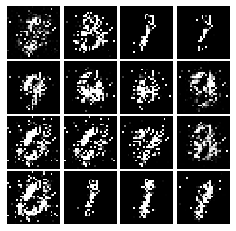

Epoch: 4, Iter: 1920, D: 0.1618, G:0.4257


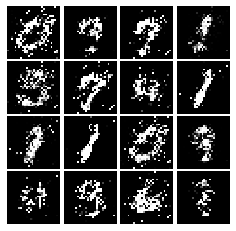

Epoch: 4, Iter: 1940, D: 0.1402, G:0.2694


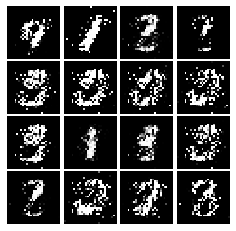

Epoch: 4, Iter: 1960, D: 0.1182, G:0.3081


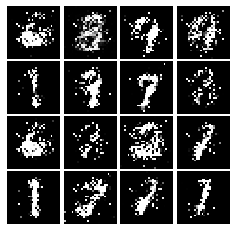

Epoch: 4, Iter: 1980, D: 0.145, G:0.2494


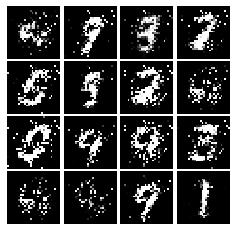

Epoch: 4, Iter: 2000, D: 0.1784, G:0.2372


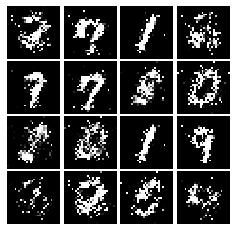

Epoch: 4, Iter: 2020, D: 0.1893, G:0.1998


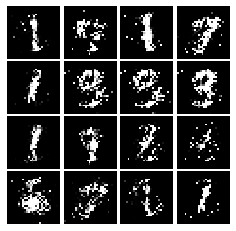

Epoch: 4, Iter: 2040, D: 0.1656, G:0.2773


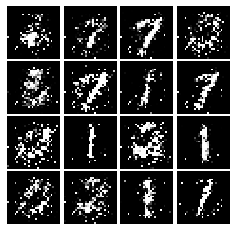

Epoch: 4, Iter: 2060, D: 0.196, G:0.5895


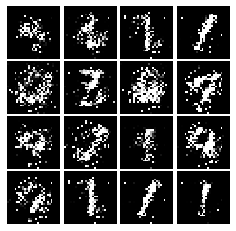

Epoch: 4, Iter: 2080, D: 0.1561, G:0.1994


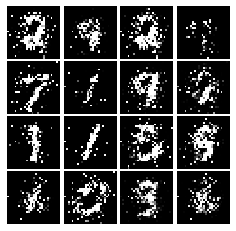

Epoch: 4, Iter: 2100, D: 0.1677, G:0.2908


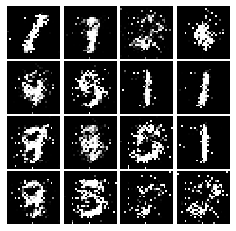

Epoch: 4, Iter: 2120, D: 0.1703, G:0.249


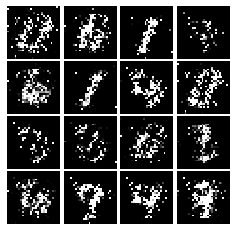

Epoch: 4, Iter: 2140, D: 0.1373, G:0.3278


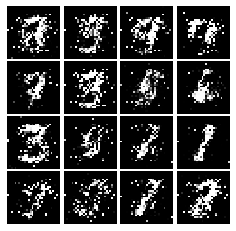

Epoch: 4, Iter: 2160, D: 0.1874, G:0.207


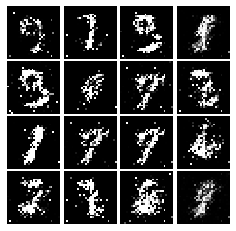

Epoch: 4, Iter: 2180, D: 0.1918, G:0.2101


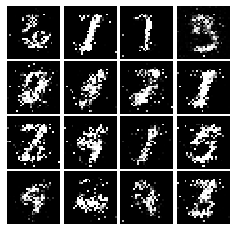

Epoch: 4, Iter: 2200, D: 0.1686, G:0.1908


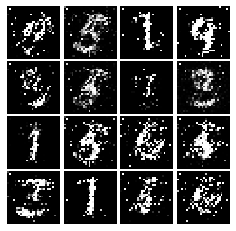

Epoch: 4, Iter: 2220, D: 0.1708, G:0.288


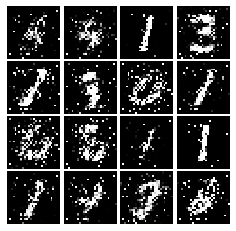

Epoch: 4, Iter: 2240, D: 0.2086, G:0.2142


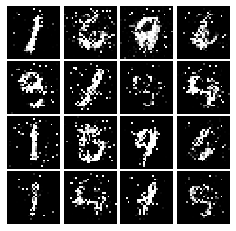

Epoch: 4, Iter: 2260, D: 0.1739, G:0.2791


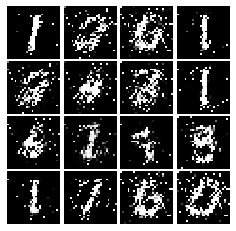

Epoch: 4, Iter: 2280, D: 0.1749, G:0.2419


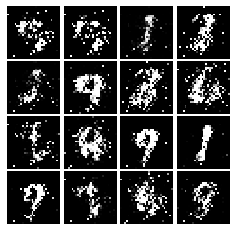

Epoch: 4, Iter: 2300, D: 0.2076, G:0.2659


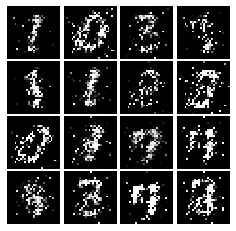

Epoch: 4, Iter: 2320, D: 0.1796, G:0.2602


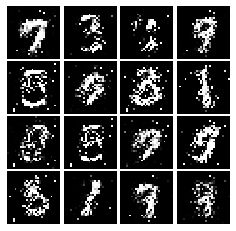

Epoch: 4, Iter: 2340, D: 0.1546, G:0.3768


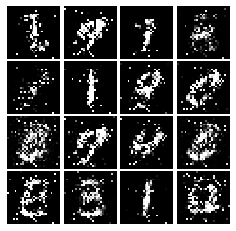

Epoch: 5, Iter: 2360, D: 0.1885, G:0.2289


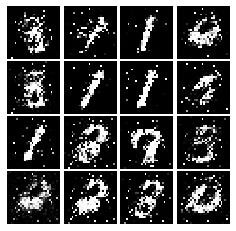

Epoch: 5, Iter: 2380, D: 0.2003, G:0.2427


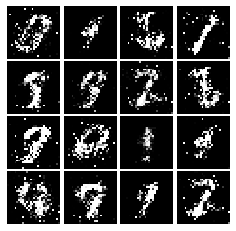

Epoch: 5, Iter: 2400, D: 0.2028, G:0.2691


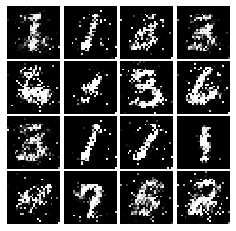

Epoch: 5, Iter: 2420, D: 0.1554, G:0.2861


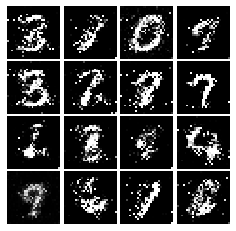

Epoch: 5, Iter: 2440, D: 0.2166, G:0.1796


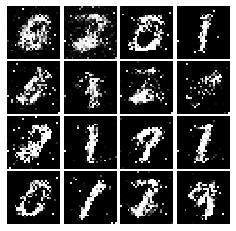

Epoch: 5, Iter: 2460, D: 0.1588, G:0.2358


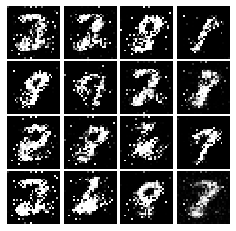

Epoch: 5, Iter: 2480, D: 0.194, G:0.2473


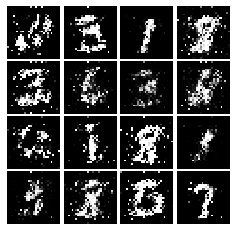

Epoch: 5, Iter: 2500, D: 0.1581, G:0.2681


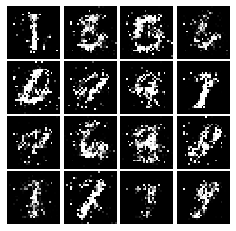

Epoch: 5, Iter: 2520, D: 0.2588, G:0.1899


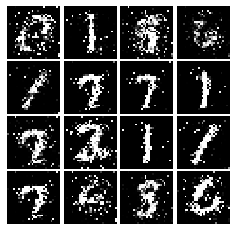

Epoch: 5, Iter: 2540, D: 0.211, G:0.2327


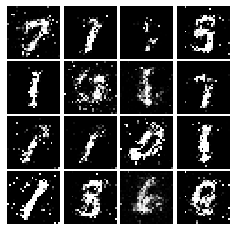

Epoch: 5, Iter: 2560, D: 0.2449, G:0.2138


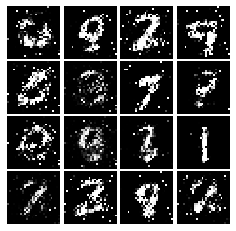

Epoch: 5, Iter: 2580, D: 0.2033, G:0.3749


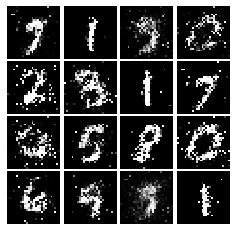

Epoch: 5, Iter: 2600, D: 0.2533, G:0.1608


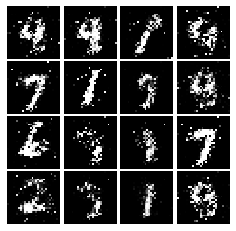

Epoch: 5, Iter: 2620, D: 0.2343, G:0.1803


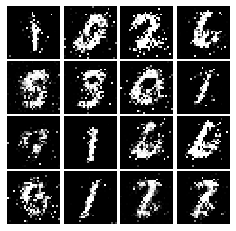

Epoch: 5, Iter: 2640, D: 0.2405, G:0.2026


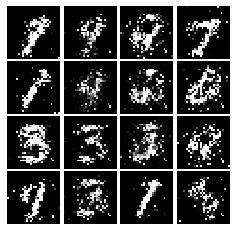

Epoch: 5, Iter: 2660, D: 0.2159, G:0.1904


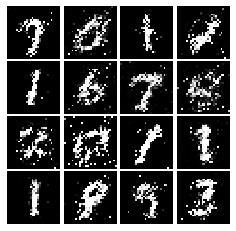

Epoch: 5, Iter: 2680, D: 0.2393, G:0.2003


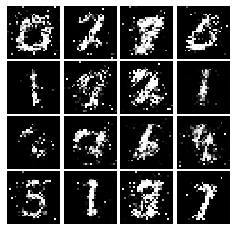

Epoch: 5, Iter: 2700, D: 0.2415, G:0.1651


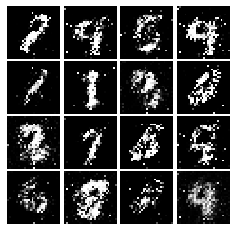

Epoch: 5, Iter: 2720, D: 0.2264, G:0.2472


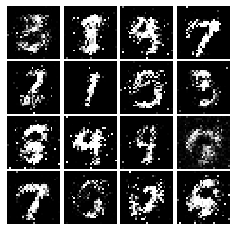

Epoch: 5, Iter: 2740, D: 0.2501, G:0.1509


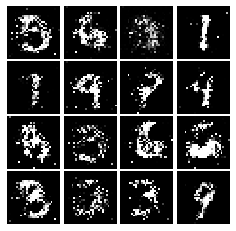

Epoch: 5, Iter: 2760, D: 0.2343, G:0.1664


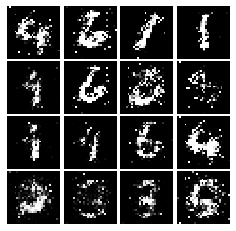

Epoch: 5, Iter: 2780, D: 0.2181, G:0.1623


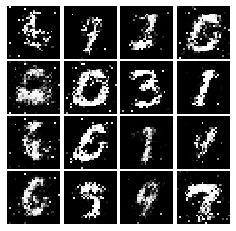

Epoch: 5, Iter: 2800, D: 0.2432, G:0.1666


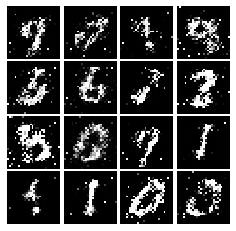

Epoch: 6, Iter: 2820, D: 0.2008, G:0.1809


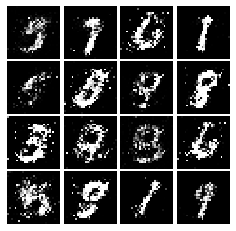

Epoch: 6, Iter: 2840, D: 0.2039, G:0.1937


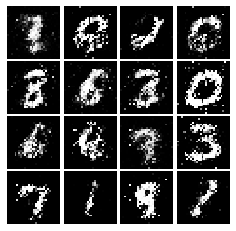

Epoch: 6, Iter: 2860, D: 0.2293, G:0.1564


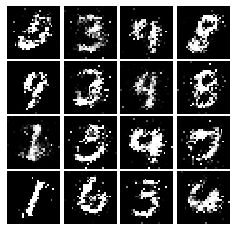

Epoch: 6, Iter: 2880, D: 0.2098, G:0.2151


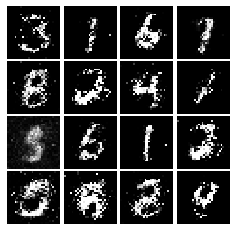

Epoch: 6, Iter: 2900, D: 0.2407, G:0.1379


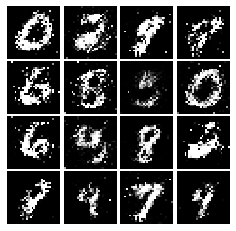

Epoch: 6, Iter: 2920, D: 0.2199, G:0.1746


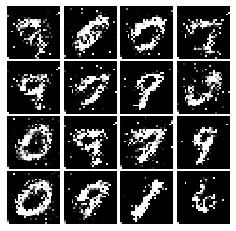

Epoch: 6, Iter: 2940, D: 0.2129, G:0.2342


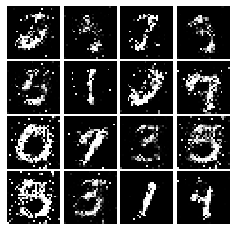

Epoch: 6, Iter: 2960, D: 0.2147, G:0.1716


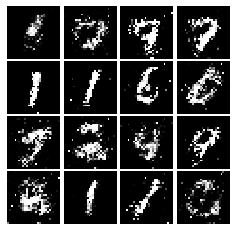

Epoch: 6, Iter: 2980, D: 0.238, G:0.1739


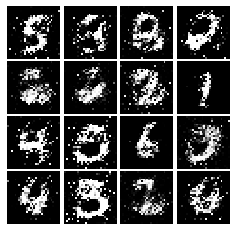

Epoch: 6, Iter: 3000, D: 0.223, G:0.1982


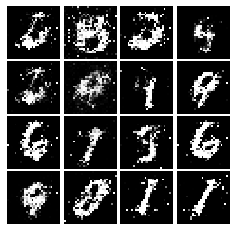

Epoch: 6, Iter: 3020, D: 0.2533, G:0.2028


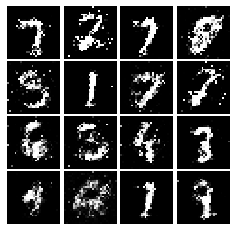

Epoch: 6, Iter: 3040, D: 0.2166, G:0.1766


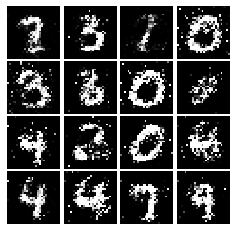

Epoch: 6, Iter: 3060, D: 0.2378, G:0.174


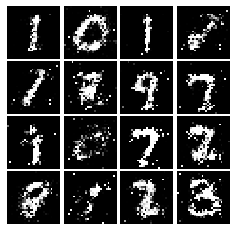

Epoch: 6, Iter: 3080, D: 0.2162, G:0.2175


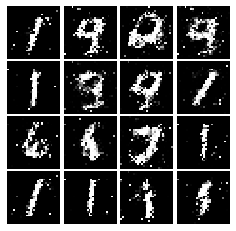

Epoch: 6, Iter: 3100, D: 0.1944, G:0.2041


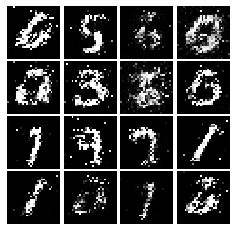

Epoch: 6, Iter: 3120, D: 0.1926, G:0.2004


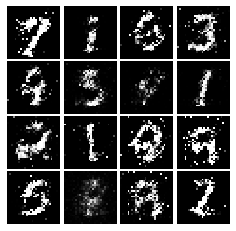

Epoch: 6, Iter: 3140, D: 0.2231, G:0.1702


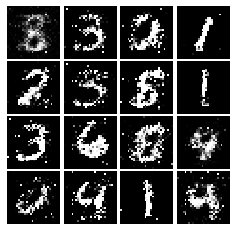

Epoch: 6, Iter: 3160, D: 0.2107, G:0.2344


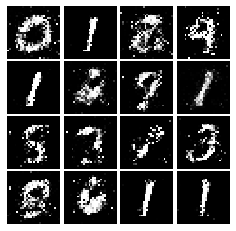

Epoch: 6, Iter: 3180, D: 0.2024, G:0.1924


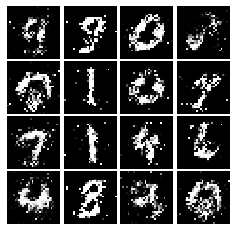

Epoch: 6, Iter: 3200, D: 0.2155, G:0.1641


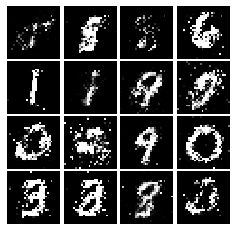

Epoch: 6, Iter: 3220, D: 0.2215, G:0.1581


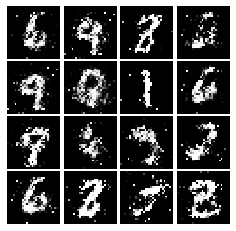

Epoch: 6, Iter: 3240, D: 0.2036, G:0.1761


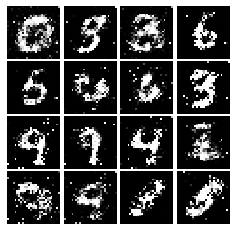

Epoch: 6, Iter: 3260, D: 0.2383, G:0.2009


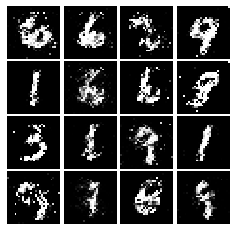

Epoch: 6, Iter: 3280, D: 0.2291, G:0.1893


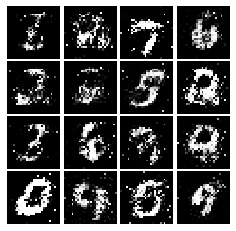

Epoch: 7, Iter: 3300, D: 0.1974, G:0.2131


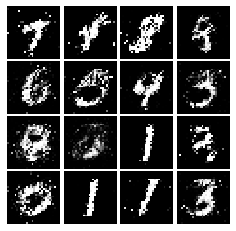

Epoch: 7, Iter: 3320, D: 0.2038, G:0.188


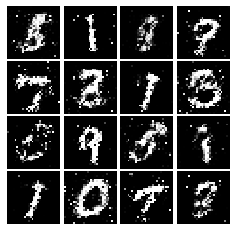

Epoch: 7, Iter: 3340, D: 0.2425, G:0.2458


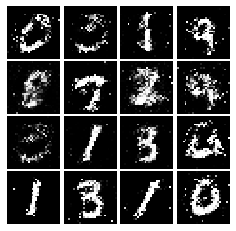

Epoch: 7, Iter: 3360, D: 0.2314, G:0.2239


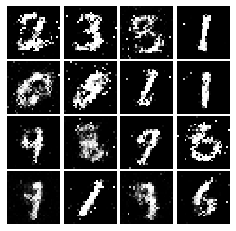

Epoch: 7, Iter: 3380, D: 0.2154, G:0.1713


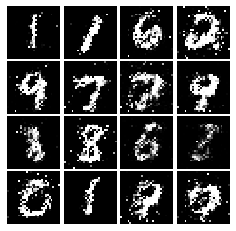

Epoch: 7, Iter: 3400, D: 0.2231, G:0.182


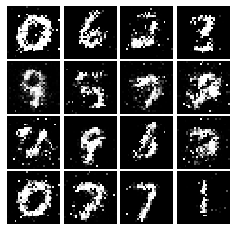

Epoch: 7, Iter: 3420, D: 0.2263, G:0.1628


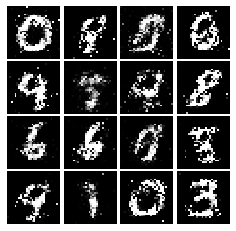

Epoch: 7, Iter: 3440, D: 0.2281, G:0.1813


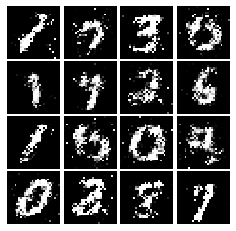

Epoch: 7, Iter: 3460, D: 0.2059, G:0.1932


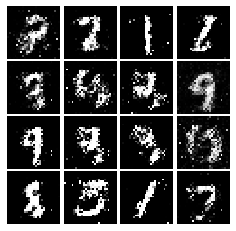

Epoch: 7, Iter: 3480, D: 0.2117, G:0.1607


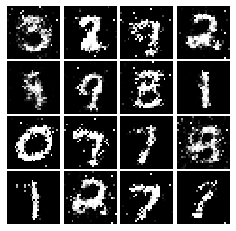

Epoch: 7, Iter: 3500, D: 0.2057, G:0.2207


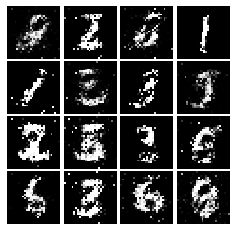

Epoch: 7, Iter: 3520, D: 0.2246, G:0.1591


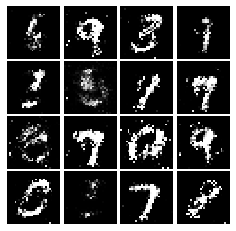

Epoch: 7, Iter: 3540, D: 0.2119, G:0.158


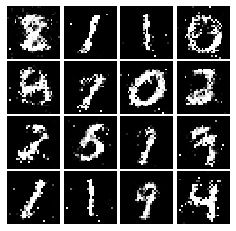

Epoch: 7, Iter: 3560, D: 0.2036, G:0.1944


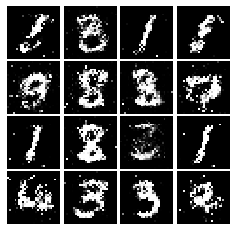

Epoch: 7, Iter: 3580, D: 0.2057, G:0.1944


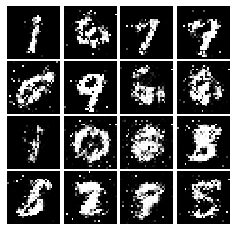

Epoch: 7, Iter: 3600, D: 0.2402, G:0.1631


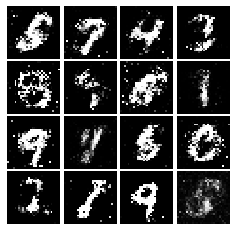

Epoch: 7, Iter: 3620, D: 0.2157, G:0.1669


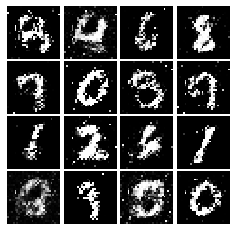

Epoch: 7, Iter: 3640, D: 0.2578, G:0.1671


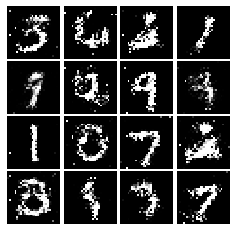

Epoch: 7, Iter: 3660, D: 0.2246, G:0.1697


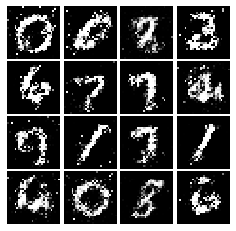

Epoch: 7, Iter: 3680, D: 0.25, G:0.1683


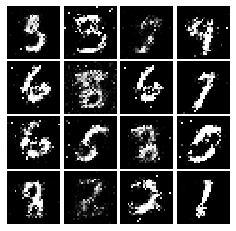

Epoch: 7, Iter: 3700, D: 0.2108, G:0.1708


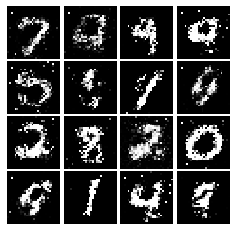

Epoch: 7, Iter: 3720, D: 0.2311, G:0.1796


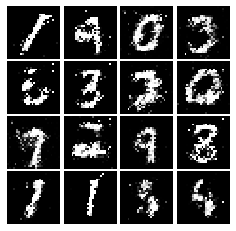

Epoch: 7, Iter: 3740, D: 0.2078, G:0.1575


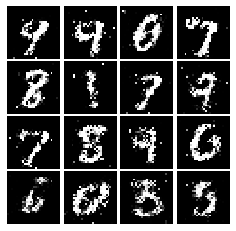

Epoch: 8, Iter: 3760, D: 0.2371, G:0.1792


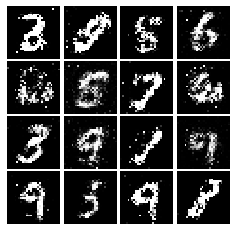

Epoch: 8, Iter: 3780, D: 0.2329, G:0.1488


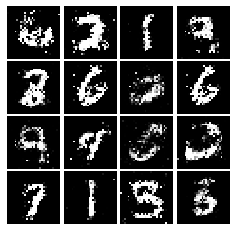

Epoch: 8, Iter: 3800, D: 0.222, G:0.1688


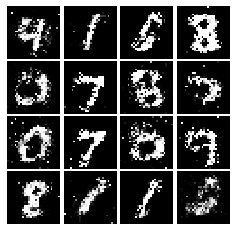

Epoch: 8, Iter: 3820, D: 0.2163, G:0.1608


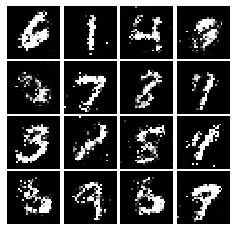

Epoch: 8, Iter: 3840, D: 0.221, G:0.1495


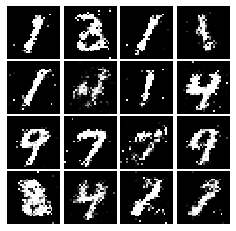

Epoch: 8, Iter: 3860, D: 0.2235, G:0.1607


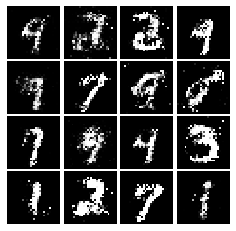

Epoch: 8, Iter: 3880, D: 0.2291, G:0.179


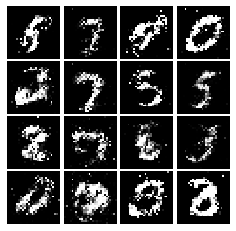

Epoch: 8, Iter: 3900, D: 0.2298, G:0.1678


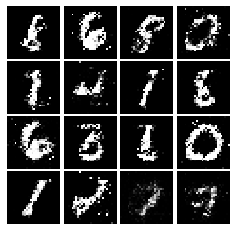

Epoch: 8, Iter: 3920, D: 0.2114, G:0.1654


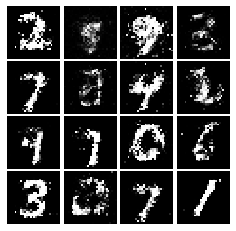

Epoch: 8, Iter: 3940, D: 0.2327, G:0.174


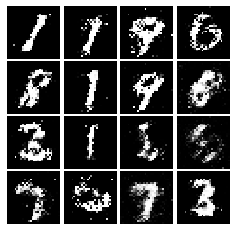

Epoch: 8, Iter: 3960, D: 0.2335, G:0.1678


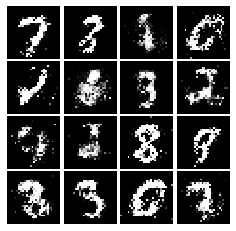

Epoch: 8, Iter: 3980, D: 0.2436, G:0.1741


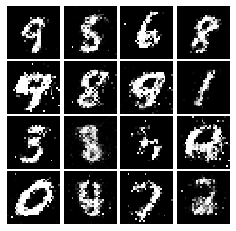

Epoch: 8, Iter: 4000, D: 0.2209, G:0.1565


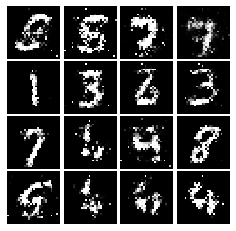

Epoch: 8, Iter: 4020, D: 0.2454, G:0.1727


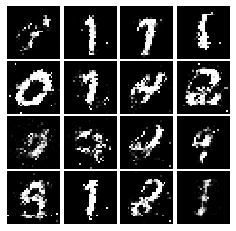

Epoch: 8, Iter: 4040, D: 0.2346, G:0.1748


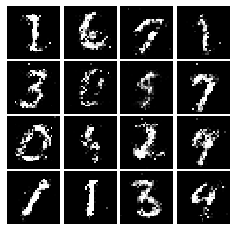

Epoch: 8, Iter: 4060, D: 0.2329, G:0.1645


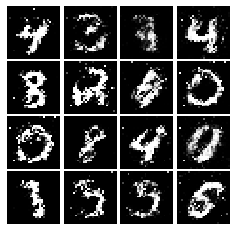

Epoch: 8, Iter: 4080, D: 0.2345, G:0.1586


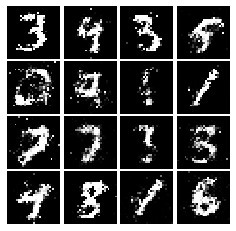

Epoch: 8, Iter: 4100, D: 0.2465, G:0.1784


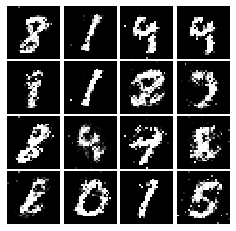

Epoch: 8, Iter: 4120, D: 0.2317, G:0.178


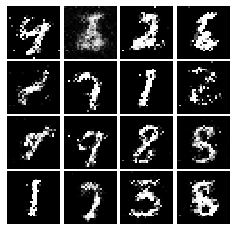

Epoch: 8, Iter: 4140, D: 0.2312, G:0.1712


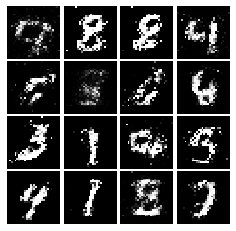

Epoch: 8, Iter: 4160, D: 0.2459, G:0.1522


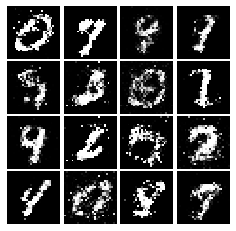

Epoch: 8, Iter: 4180, D: 0.2636, G:0.178


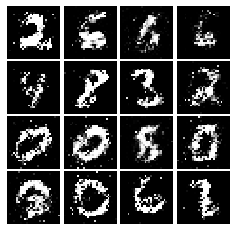

Epoch: 8, Iter: 4200, D: 0.2204, G:0.1636


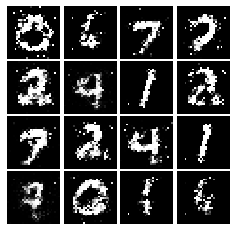

Epoch: 8, Iter: 4220, D: 0.2088, G:0.1806


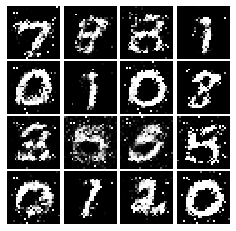

Epoch: 9, Iter: 4240, D: 0.2538, G:0.1524


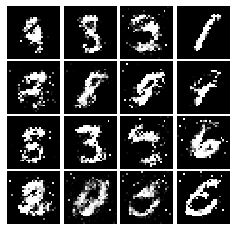

Epoch: 9, Iter: 4260, D: 0.2225, G:0.1689


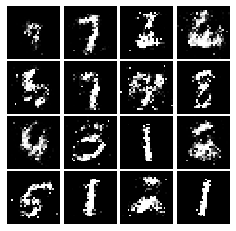

Epoch: 9, Iter: 4280, D: 0.2568, G:0.1572


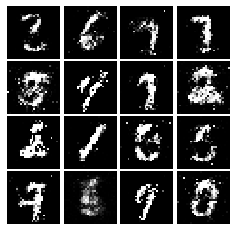

Epoch: 9, Iter: 4300, D: 0.2359, G:0.1682


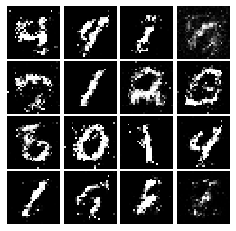

Epoch: 9, Iter: 4320, D: 0.2391, G:0.1591


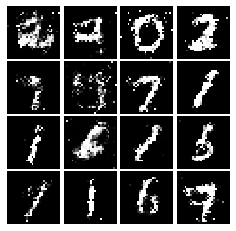

Epoch: 9, Iter: 4340, D: 0.2266, G:0.166


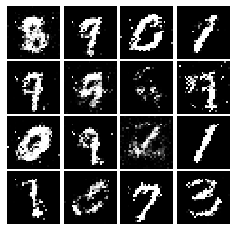

Epoch: 9, Iter: 4360, D: 0.2345, G:0.1544


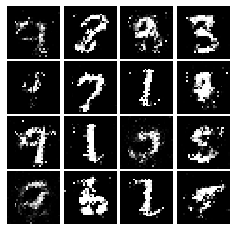

Epoch: 9, Iter: 4380, D: 0.2421, G:0.1797


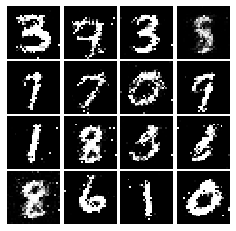

Epoch: 9, Iter: 4400, D: 0.2007, G:0.2193


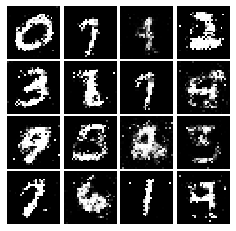

Epoch: 9, Iter: 4420, D: 0.2068, G:0.17


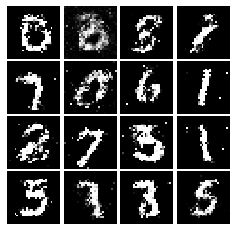

Epoch: 9, Iter: 4440, D: 0.2018, G:0.1815


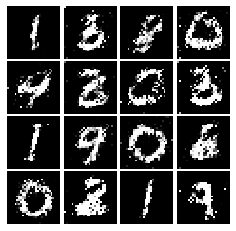

Epoch: 9, Iter: 4460, D: 0.2227, G:0.1707


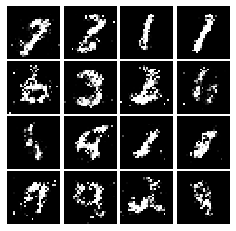

Epoch: 9, Iter: 4480, D: 0.2051, G:0.1763


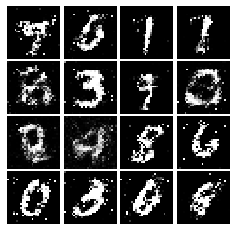

Epoch: 9, Iter: 4500, D: 0.246, G:0.1557


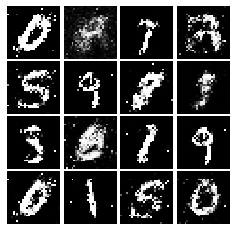

Epoch: 9, Iter: 4520, D: 0.2174, G:0.1661


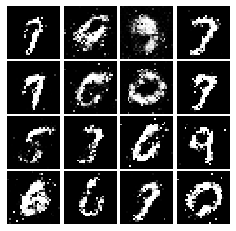

Epoch: 9, Iter: 4540, D: 0.2394, G:0.1473


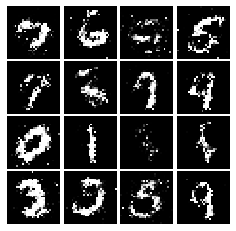

Epoch: 9, Iter: 4560, D: 0.2302, G:0.1561


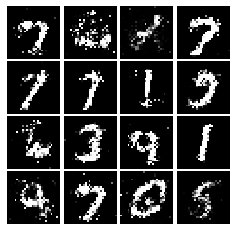

Epoch: 9, Iter: 4580, D: 0.2204, G:0.1605


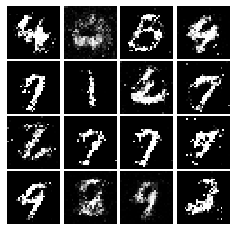

Epoch: 9, Iter: 4600, D: 0.2165, G:0.167


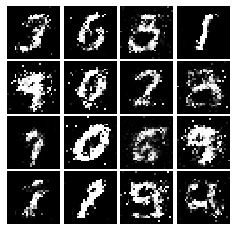

Epoch: 9, Iter: 4620, D: 0.2528, G:0.1897


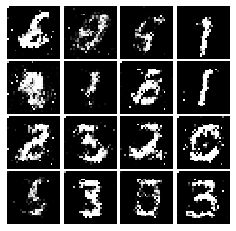

Epoch: 9, Iter: 4640, D: 0.2196, G:0.173


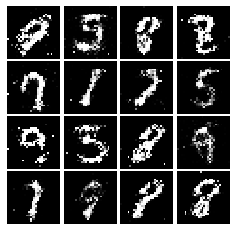

Epoch: 9, Iter: 4660, D: 0.2241, G:0.151


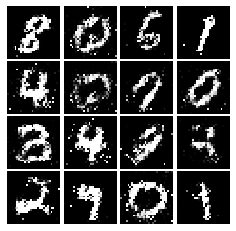

Epoch: 9, Iter: 4680, D: 0.2521, G:0.1819


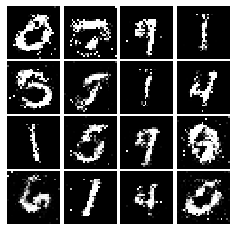

Final images


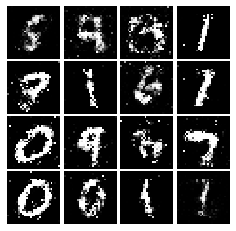

In [38]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [51]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(input_shape = (784,)),
        tf.keras.layers.Reshape((28,28,1)),
        tf.keras.layers.Conv2D(filters = 32, kernel_size = 5, strides = 1, padding = 'valid', activation = leaky_relu),
        tf.keras.layers.MaxPooling2D(), # default pool_size = (2,2) ; stride by default is equal to pool_size
        tf.keras.layers.Conv2D(filters = 64, kernel_size = 5, strides = 1, padding = 'valid', activation = leaky_relu),
        tf.keras.layers.MaxPooling2D(),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(units = 4*4*64, activation = leaky_relu),
        tf.keras.layers.Dense(units = 1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [69]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential()
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    model.add(tf.keras.layers.Dense(input_shape = (noise_dim,), units = 1024, activation = 'relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dense(units = 7*7*128, activation = 'relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Reshape((7,7,128)))
    model.add(tf.keras.layers.Conv2DTranspose(filters = 64, kernel_size = 4, strides = 2, padding ='same', activation = 'relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Conv2DTranspose(filters = 1, kernel_size = 4, strides = 2, padding ='same', activation = 'tanh'))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.244, G:0.6541


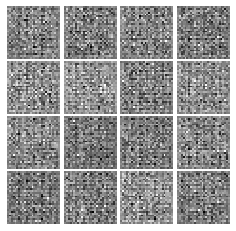

Epoch: 0, Iter: 20, D: 0.2859, G:1.763


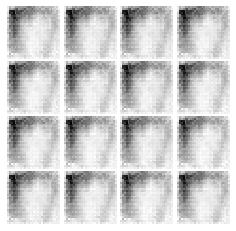

Epoch: 0, Iter: 40, D: 0.004603, G:5.508


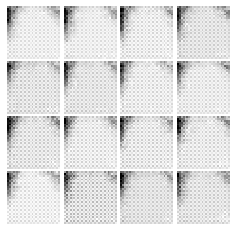

Epoch: 0, Iter: 60, D: 0.001164, G:6.815


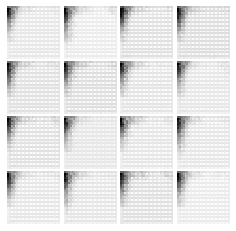

Epoch: 0, Iter: 80, D: 0.001244, G:7.481


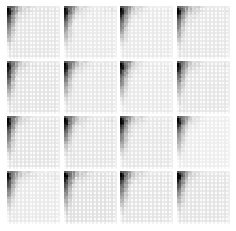

Epoch: 0, Iter: 100, D: 0.0003408, G:8.023


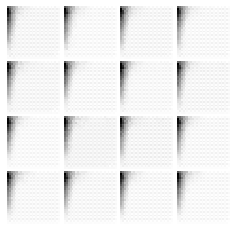

Epoch: 0, Iter: 120, D: 0.0002853, G:8.422


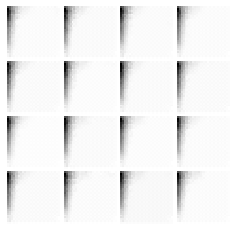

Epoch: 0, Iter: 140, D: 0.0001612, G:8.755


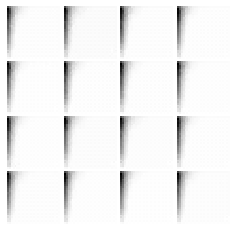

Epoch: 0, Iter: 160, D: 0.0001172, G:9.08


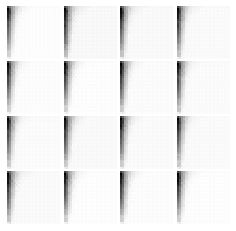

Epoch: 0, Iter: 180, D: 9.258e-05, G:9.348


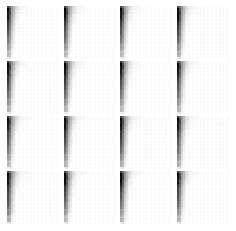

Epoch: 0, Iter: 200, D: 7.192e-05, G:9.561


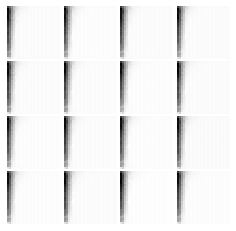

Epoch: 0, Iter: 220, D: 6.201e-05, G:9.706


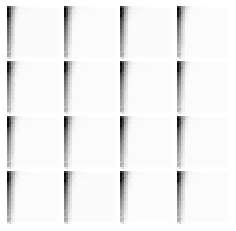

Epoch: 0, Iter: 240, D: 5.727e-05, G:9.8


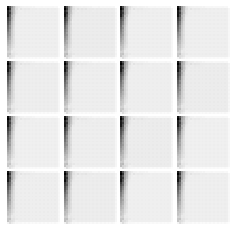

Epoch: 0, Iter: 260, D: 0.0002812, G:8.449


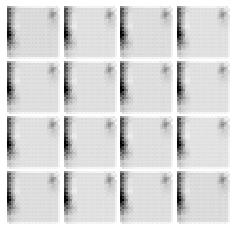

Epoch: 0, Iter: 280, D: 0.9746, G:1.196


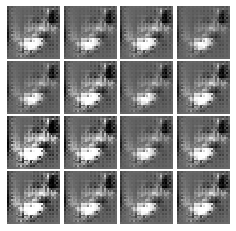

Epoch: 0, Iter: 300, D: 1.419, G:2.477


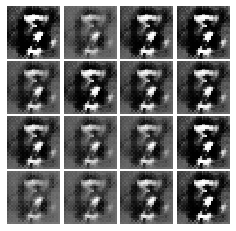

Epoch: 0, Iter: 320, D: 0.9062, G:2.063


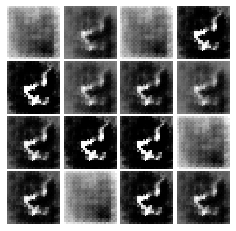

Epoch: 0, Iter: 340, D: 1.511, G:1.493


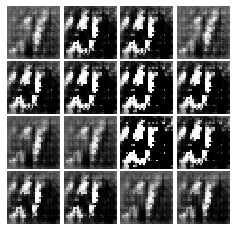

Epoch: 0, Iter: 360, D: 0.5139, G:8.052


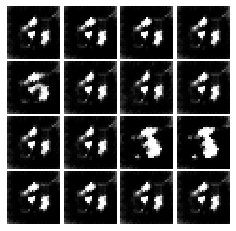

Epoch: 0, Iter: 380, D: 0.2038, G:6.629


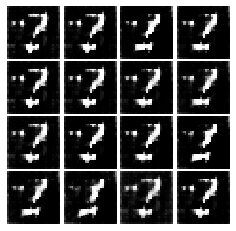

Epoch: 0, Iter: 400, D: 1.467, G:2.178


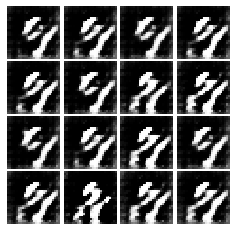

Epoch: 0, Iter: 420, D: 0.7896, G:1.094


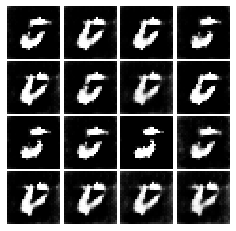

Epoch: 0, Iter: 440, D: 0.7716, G:3.133


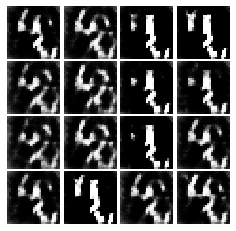

Epoch: 0, Iter: 460, D: 0.3257, G:3.396


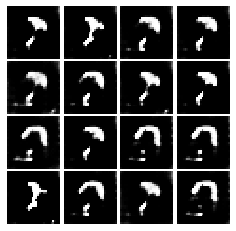

Epoch: 1, Iter: 480, D: 0.7133, G:2.216


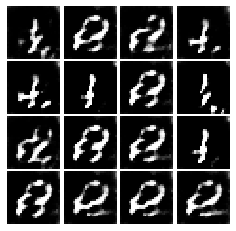

Epoch: 1, Iter: 500, D: 0.6396, G:1.786


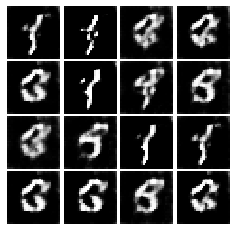

Epoch: 1, Iter: 520, D: 1.21, G:2.237


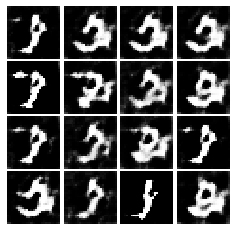

Epoch: 1, Iter: 540, D: 0.9267, G:1.544


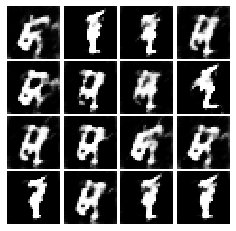

Epoch: 1, Iter: 560, D: 1.027, G:1.624


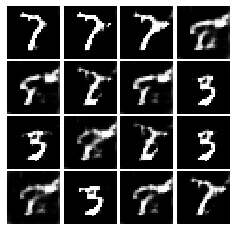

Epoch: 1, Iter: 580, D: 0.8889, G:1.564


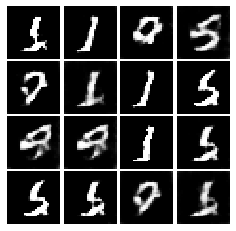

Epoch: 1, Iter: 600, D: 0.9189, G:2.169


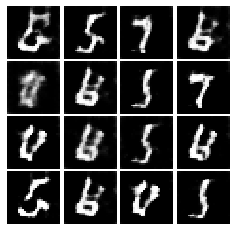

Epoch: 1, Iter: 620, D: 0.9249, G:0.9747


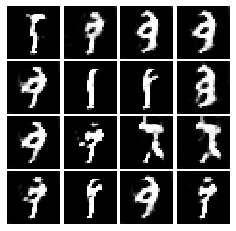

Epoch: 1, Iter: 640, D: 1.414, G:3.567


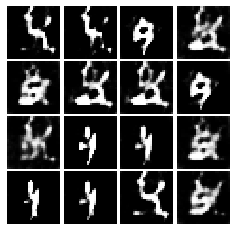

Epoch: 1, Iter: 660, D: 0.7814, G:2.269


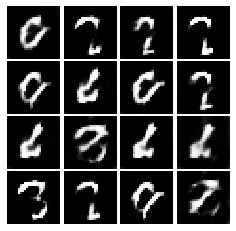

Epoch: 1, Iter: 680, D: 0.7608, G:2.561


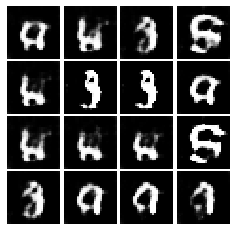

Epoch: 1, Iter: 700, D: 0.4714, G:3.062


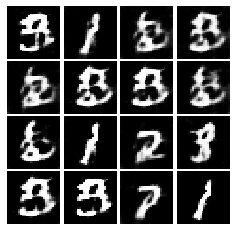

Epoch: 1, Iter: 720, D: 0.6781, G:2.682


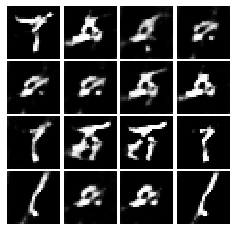

Epoch: 1, Iter: 740, D: 0.9251, G:2.41


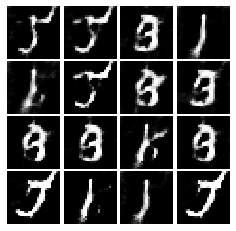

Epoch: 1, Iter: 760, D: 0.8229, G:3.466


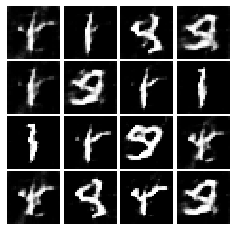

Epoch: 1, Iter: 780, D: 1.173, G:1.146


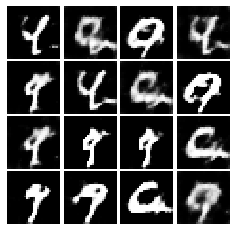

Epoch: 1, Iter: 800, D: 0.9945, G:2.448


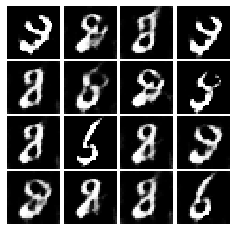

Epoch: 1, Iter: 820, D: 0.752, G:2.175


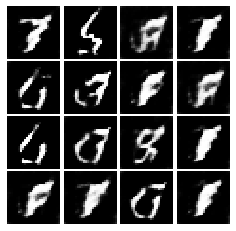

Epoch: 1, Iter: 840, D: 0.5228, G:2.862


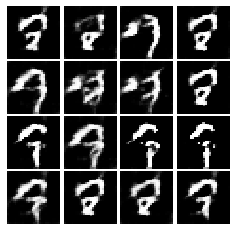

Epoch: 1, Iter: 860, D: 0.5479, G:2.386


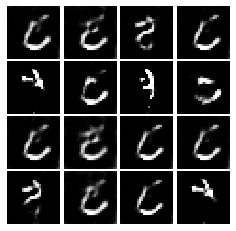

Epoch: 1, Iter: 880, D: 0.4111, G:3.563


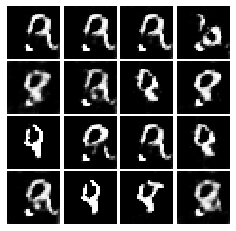

Epoch: 1, Iter: 900, D: 0.9206, G:4.002


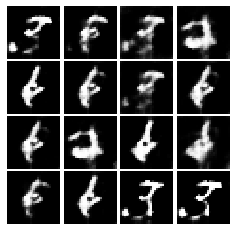

Epoch: 1, Iter: 920, D: 0.5136, G:2.721


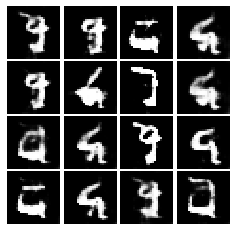

Epoch: 2, Iter: 940, D: 0.7495, G:2.523


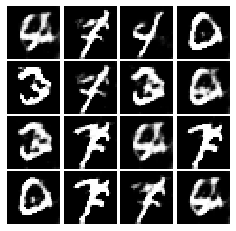

Epoch: 2, Iter: 960, D: 0.698, G:3.784


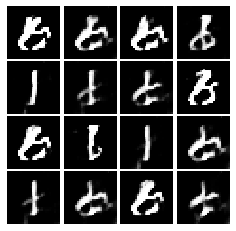

Epoch: 2, Iter: 980, D: 0.4505, G:1.898


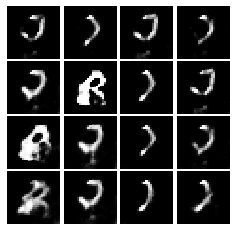

Epoch: 2, Iter: 1000, D: 1.374, G:1.715


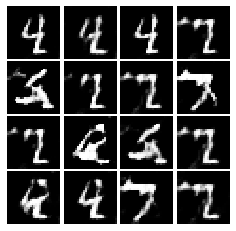

Epoch: 2, Iter: 1020, D: 0.4165, G:2.673


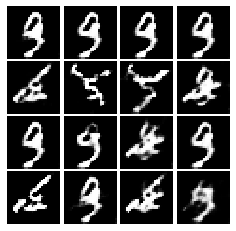

Epoch: 2, Iter: 1040, D: 1.393, G:0.4096


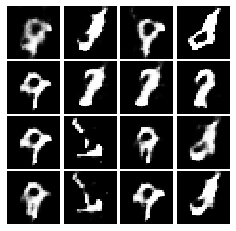

Epoch: 2, Iter: 1060, D: 0.3313, G:2.478


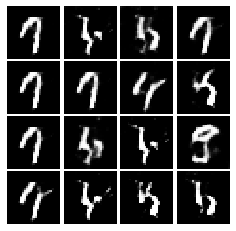

Epoch: 2, Iter: 1080, D: 0.5404, G:1.758


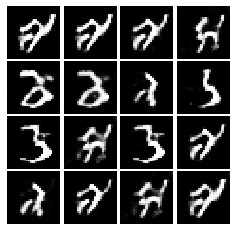

Epoch: 2, Iter: 1100, D: 1.064, G:3.003


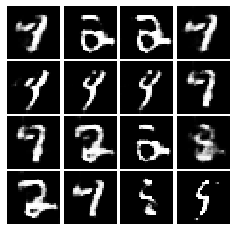

Epoch: 2, Iter: 1120, D: 0.6297, G:2.631


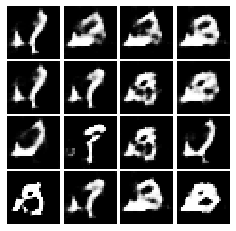

Epoch: 2, Iter: 1140, D: 0.6543, G:3.272


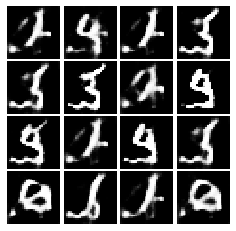

Epoch: 2, Iter: 1160, D: 0.5862, G:3.031


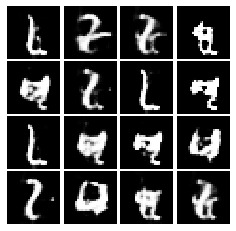

Epoch: 2, Iter: 1180, D: 0.491, G:1.854


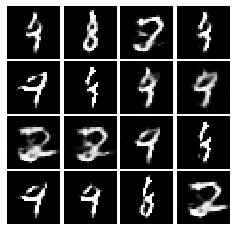

Epoch: 2, Iter: 1200, D: 0.1801, G:3.068


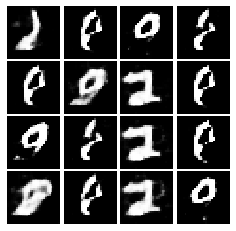

Epoch: 2, Iter: 1220, D: 0.8309, G:3.433


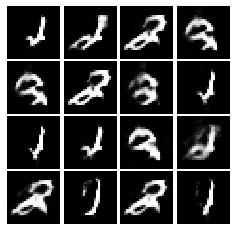

Epoch: 2, Iter: 1240, D: 0.4969, G:3.442


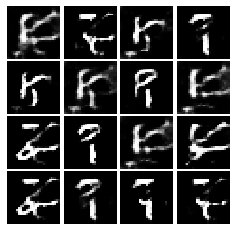

Epoch: 2, Iter: 1260, D: 0.7687, G:4.094


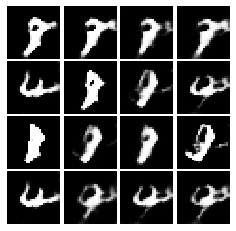

Epoch: 2, Iter: 1280, D: 0.5931, G:3.983


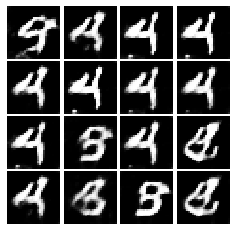

Epoch: 2, Iter: 1300, D: 0.3412, G:3.203


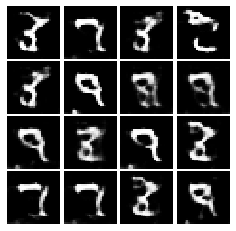

Epoch: 2, Iter: 1320, D: 0.5845, G:2.7


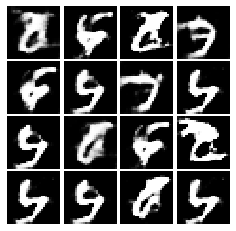

Epoch: 2, Iter: 1340, D: 0.5189, G:2.741


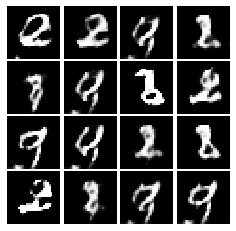

Epoch: 2, Iter: 1360, D: 0.5254, G:2.653


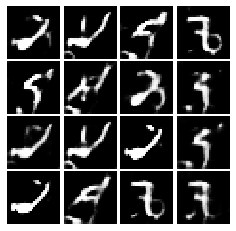

Epoch: 2, Iter: 1380, D: 0.3443, G:2.562


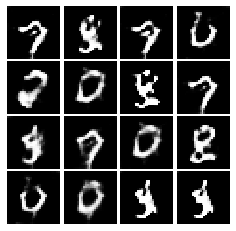

Epoch: 2, Iter: 1400, D: 0.6942, G:2.691


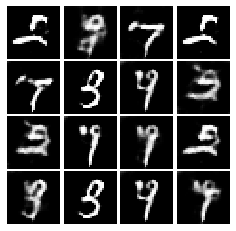

Epoch: 3, Iter: 1420, D: 0.4254, G:3.179


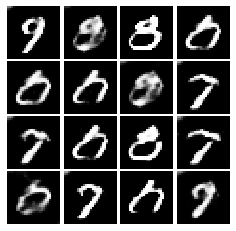

Epoch: 3, Iter: 1440, D: 0.3952, G:3.449


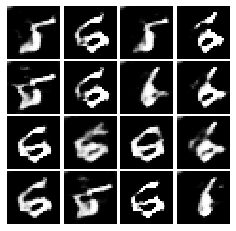

Epoch: 3, Iter: 1460, D: 1.53, G:9.231


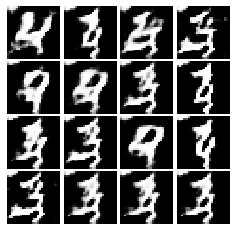

Epoch: 3, Iter: 1480, D: 0.1657, G:4.2


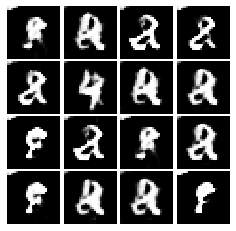

Epoch: 3, Iter: 1500, D: 0.6952, G:3.425


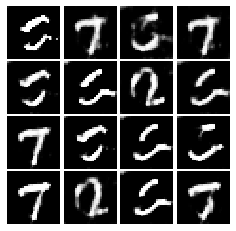

Epoch: 3, Iter: 1520, D: 0.4098, G:2.783


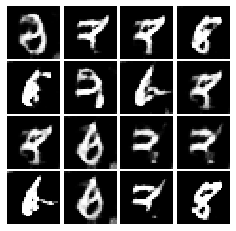

Epoch: 3, Iter: 1540, D: 0.6154, G:4.573


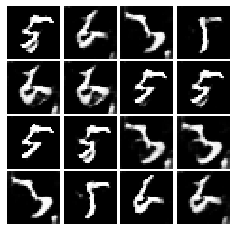

Epoch: 3, Iter: 1560, D: 0.7656, G:3.611


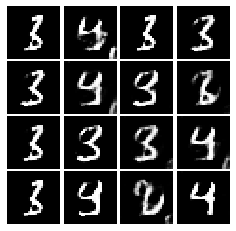

Epoch: 3, Iter: 1580, D: 0.2955, G:2.793


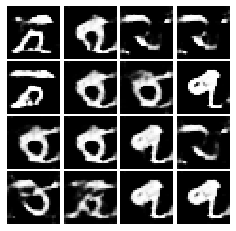

Epoch: 3, Iter: 1600, D: 0.6556, G:2.942


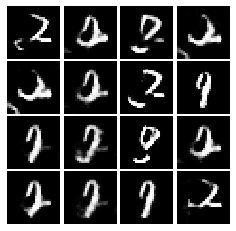

Epoch: 3, Iter: 1620, D: 0.4406, G:5.265


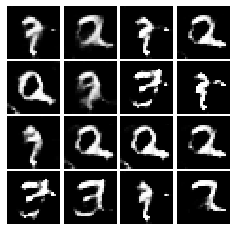

Epoch: 3, Iter: 1640, D: 0.4037, G:4.293


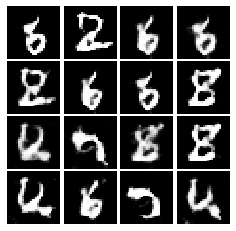

Epoch: 3, Iter: 1660, D: 0.3591, G:3.208


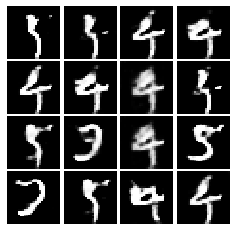

Epoch: 3, Iter: 1680, D: 0.4406, G:3.578


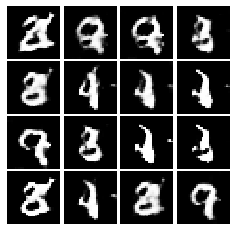

Epoch: 3, Iter: 1700, D: 0.5037, G:2.34


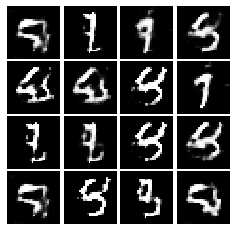

Epoch: 3, Iter: 1720, D: 0.4745, G:3.198


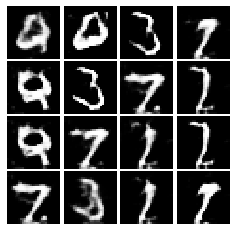

Epoch: 3, Iter: 1740, D: 0.619, G:2.538


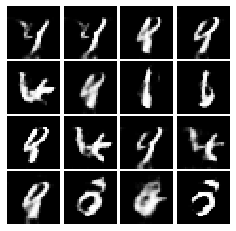

Epoch: 3, Iter: 1760, D: 0.4278, G:3.155


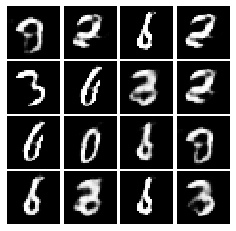

Epoch: 3, Iter: 1780, D: 0.3156, G:3.123


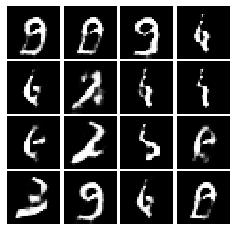

Epoch: 3, Iter: 1800, D: 0.7935, G:2.991


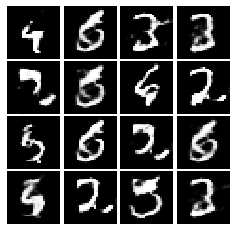

Epoch: 3, Iter: 1820, D: 0.9621, G:5.356


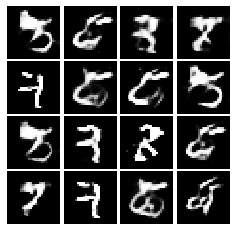

Epoch: 3, Iter: 1840, D: 0.6587, G:2.566


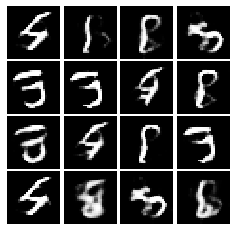

Epoch: 3, Iter: 1860, D: 0.4502, G:2.597


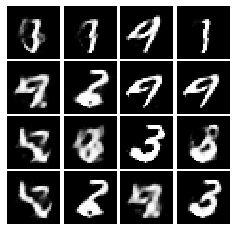

Epoch: 4, Iter: 1880, D: 0.4302, G:3.517


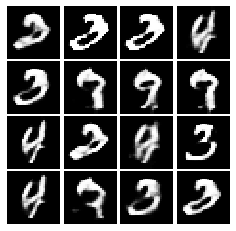

Epoch: 4, Iter: 1900, D: 0.4175, G:2.588


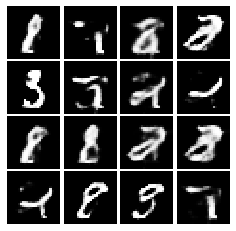

Epoch: 4, Iter: 1920, D: 0.3299, G:3.558


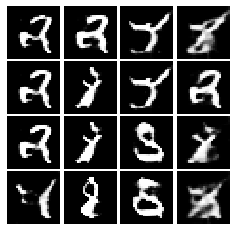

Epoch: 4, Iter: 1940, D: 0.3361, G:3.411


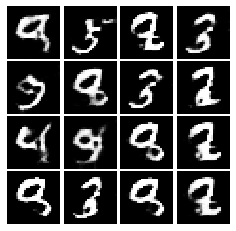

Epoch: 4, Iter: 1960, D: 0.6826, G:5.777


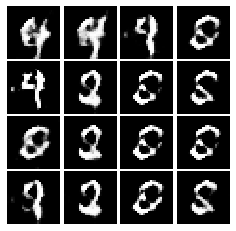

Epoch: 4, Iter: 1980, D: 0.218, G:3.22


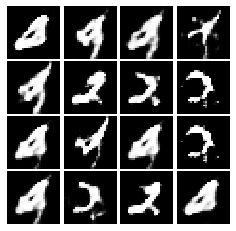

Epoch: 4, Iter: 2000, D: 1.234, G:1.934


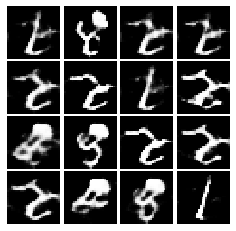

Epoch: 4, Iter: 2020, D: 0.6242, G:2.619


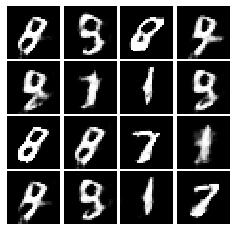

Epoch: 4, Iter: 2040, D: 0.5006, G:3.799


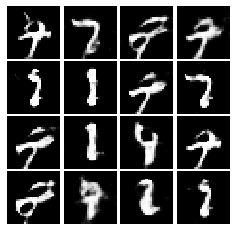

Epoch: 4, Iter: 2060, D: 0.3537, G:3.148


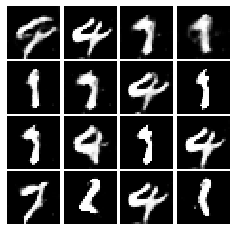

Epoch: 4, Iter: 2080, D: 0.5442, G:2.297


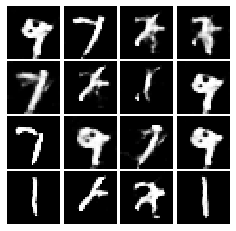

Epoch: 4, Iter: 2100, D: 0.5211, G:3.884


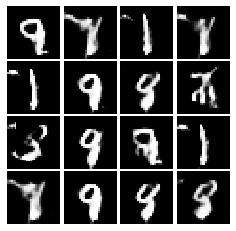

Epoch: 4, Iter: 2120, D: 0.4883, G:2.106


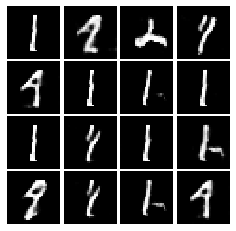

Epoch: 4, Iter: 2140, D: 0.6524, G:2.297


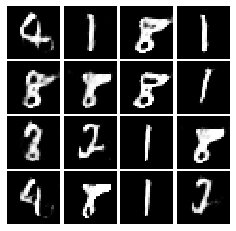

Epoch: 4, Iter: 2160, D: 0.5774, G:2.242


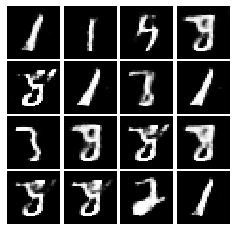

Epoch: 4, Iter: 2180, D: 0.505, G:3.959


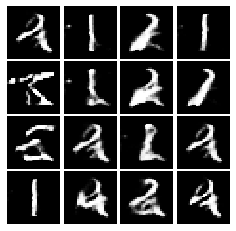

Epoch: 4, Iter: 2200, D: 0.829, G:1.809


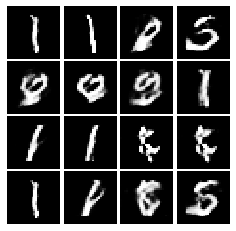

Epoch: 4, Iter: 2220, D: 0.4039, G:2.595


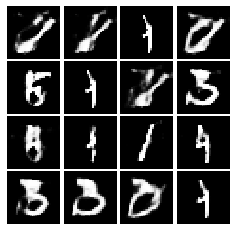

Epoch: 4, Iter: 2240, D: 1.3, G:4.331


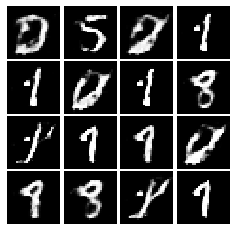

Epoch: 4, Iter: 2260, D: 0.4962, G:4.509


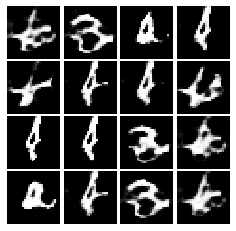

Epoch: 4, Iter: 2280, D: 0.2822, G:3.773


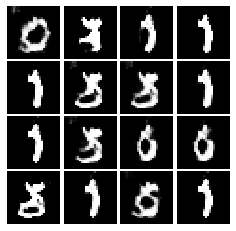

Epoch: 4, Iter: 2300, D: 0.2667, G:3.992


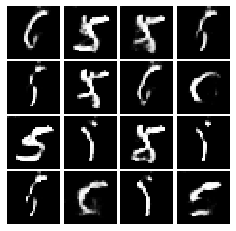

Epoch: 4, Iter: 2320, D: 0.2952, G:3.354


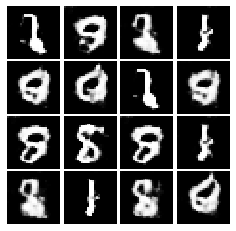

Epoch: 4, Iter: 2340, D: 0.6057, G:4.165


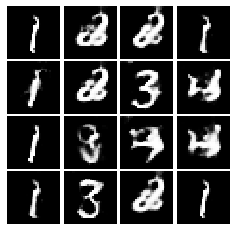

Final images


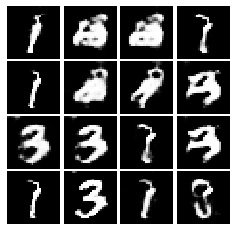

In [71]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |   2    |   0    |   0    |   0    |   0    |  0     
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |   -2   |    0   |   0    |   0    |   0    |   0
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 

Using this method, we will reach the optimal value

## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
That is not a good sign because the discriminator is not learning to classify real images correctly. It classifies images created by the generator from noise as real ones and because of that, the generator loss decreases during training